# Análisis Exploratorio con Visualizaciones y Librería Personalizada

## Importar las librerias

In [1]:
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

In [2]:
# importar librerias del modulo preprocessing
from ctg_viz.preprocessing import completitud_datos
from ctg_viz.preprocessing import columnas_float_enteras
from ctg_viz.preprocessing import check_data_completeness_juan_miguel_galan_olivares
from ctg_viz.categorization import clasificar_columnas_continuas_discretas
from utils import detect_outliers
from utils import _plot_outliers
from utils import analyze_outliers_impact

from ctg_viz.plots.histograms import plot_histograms
from ctg_viz.plots.boxplots import plot_boxplots
from ctg_viz.plots.barplots import plot_barplots
from ctg_viz.plots.density import plot_density
from ctg_viz.plots.heatmap import plot_heatmap, compute_spearman_corr
from ctg_viz.plots.lineas import plot_lineplots
from ctg_viz.plots.dotplot import plot_dotplots
from ctg_viz.plots.violin import plot_violins

## 1.- Preprocesamiento

In [8]:
data = pd.read_csv(r'./data/CTG.csv')

In [9]:
data.sample(2)

,FileName,Date,SegFile,b,e,LBE,LB,AC,FM,UC,...,C,D,E,AD,DE,LD,FS,SUSP,CLASS,NSP
2034,S8001038.dsp,5/10/1998,CTG2037.txt,752.0,1684.0,129.0,129.0,0.0,1.0,6.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,8.0,3.0
122,Mrmmf_3.txt,1/8/1995,CTG0123.txt,301.0,955.0,123.0,123.0,0.0,0.0,3.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,7.0,1.0


### Eliminar columnas con más del 20% de valores nulos

In [10]:
# Vemos que no hay columnas con mas del 20% de datos faltantes, 
# ya que la funcion los ordena de mayor a menor segun el porcentaje de datos faltantes
completitud_datos(data).head()

FileName    0.14
Date        0.14
SegFile     0.14
b           0.14
e           0.14
dtype: float64

In [11]:
analisis = data[data['FileName'].isnull()]

In [12]:
# Notamos que las columnas que no tienen nombre de archivo asociado
# tienen muchos datos faltantes, excepto por las ultimas columnas
completitud_datos(analisis).tail(11)

NSP     100.00
UC       66.67
FM       66.67
ALTV     66.67
MLTV     66.67
ASTV     66.67
MSTV     66.67
DR       33.33
DP       33.33
DL       33.33
DS       33.33
dtype: float64

### Imputar valores faltantes restantes con métodos adecuados:

- Media / Mediana para numéricos
- Moda para categóricos
- O bien KNN Imputer (reto adicional) 5% adicional


In [13]:
check_data_completeness_juan_miguel_galan_olivares(data)

,Num_nulls,%_completeness,dtype,mean,std,min,25%,50%,75%,max
FileName,3,99.86,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Date,3,99.86,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SegFile,3,99.86,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN
b,3,99.86,float64,878.439793,894.084748,0.0,55.0,538.0,1521.00,3296.0
e,3,99.86,float64,1702.877234,930.919143,287.0,1009.0,1241.0,2434.75,3599.0
LBE,3,99.86,float64,133.303857,9.840844,106.0,126.0,133.0,140.00,160.0
LB,3,99.86,float64,133.303857,9.840844,106.0,126.0,133.0,140.00,160.0
AC,3,99.86,float64,2.722484,3.560850,0.0,0.0,1.0,4.00,26.0
FM,2,99.91,float64,7.503056,39.030452,0.0,0.0,0.0,2.00,564.0
UC,2,99.91,float64,3.669017,2.877148,0.0,1.0,3.0,5.00,23.0


In [14]:
data.columns

Index(['FileName', 'Date', 'SegFile', 'b', 'e', 'LBE', 'LB', 'AC', 'FM', 'UC',
       'ASTV', 'MSTV', 'ALTV', 'MLTV', 'DL', 'DS', 'DP', 'DR', 'Width', 'Min',
       'Max', 'Nmax', 'Nzeros', 'Mode', 'Mean', 'Median', 'Variance',
       'Tendency', 'A', 'B', 'C', 'D', 'E', 'AD', 'DE', 'LD', 'FS', 'SUSP',
       'CLASS', 'NSP'],
      dtype='object')

In [15]:
columnas_float_enteras(data)['decimales']

['MSTV', 'MLTV']

In [16]:
# Las variables 'A', 'B', 'C', 'D', 'AD', 'DE', 'LD', 'FS', 'SUSP', 'CLASS', 'NSP' son categoricas, se imputaran con la moda

# Definir las columnas por tipo
colum_categoricas = ['A', 'B', 'C', 'D', 'AD', 'DE', 'LD', 'FS', 'SUSP', 'CLASS', 'NSP', 'Tendency']
variables_KNN = ['b', 'e']
variables_meadiana = ['LBE', 'LB', 'AC', 'FM', 'UC', 'ASTV', 'ALTV', 'DL', 'DS', 'DP', 
                    'DR', 'Width', 'Min', 'Max', 'Nmax', 'Nzeros', 'Mode', 'Mean', 'Median', 'Variance', 'B', 'C', 'D', 'E']
variables_media = ['MSTV', 'MLTV']

# Imputar valores categóricos con la moda
imputer_categorical = SimpleImputer(strategy='most_frequent')
data[colum_categoricas] = imputer_categorical.fit_transform(data[colum_categoricas])

# Imputar valores con la mediana (son enteros)
imputer_float_integer = SimpleImputer(strategy='median')
data[variables_meadiana] = imputer_float_integer.fit_transform(data[variables_meadiana])

# Imputar valores con la media (son flotantes)
imputer_float_integer = SimpleImputer(strategy='mean')
data[variables_media] = imputer_float_integer.fit_transform(data[variables_media])

# Imputar valores con KNNImputer (son enteros que dependen de otros)
imputer_float_decimal = KNNImputer(n_neighbors=5)
data[variables_KNN] = imputer_float_decimal.fit_transform(data[variables_KNN])

In [17]:
imputer_const = SimpleImputer(strategy="constant", fill_value="Unknown")
data[["FileName", "SegFile"]] = imputer_const.fit_transform(data[["FileName", "SegFile"]])


In [18]:
# ver el dataframe por indices como dataframe
data.loc[[2126, 2127, 2128]]

,FileName,Date,SegFile,b,e,LBE,LB,AC,FM,UC,...,C,D,E,AD,DE,LD,FS,SUSP,CLASS,NSP
2126,Unknown,NaN,Unknown,878.439793,1702.877234,133.0,133.0,1.0,0.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0
2127,Unknown,NaN,Unknown,878.439793,1702.877234,133.0,133.0,1.0,0.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0
2128,Unknown,NaN,Unknown,878.439793,1702.877234,133.0,133.0,1.0,564.0,23.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0


In [19]:
check_data_completeness_juan_miguel_galan_olivares(data)    

,Num_nulls,%_completeness,dtype,mean,std,min,25%,50%,75%,max
FileName,0,100.00,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Date,3,99.86,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SegFile,0,100.00,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN
b,0,100.00,float64,878.439793,893.454296,0.0,55.0,538.0,1518.0,3296.0
e,0,100.00,float64,1702.877234,930.262718,287.0,1009.0,1244.0,2434.0,3599.0
LBE,0,100.00,float64,133.303429,9.833912,106.0,126.0,133.0,140.0,160.0
LB,0,100.00,float64,133.303429,9.833912,106.0,126.0,133.0,140.0,160.0
AC,0,100.00,float64,2.720056,3.558926,0.0,0.0,1.0,4.0,26.0
FM,0,100.00,float64,7.496008,39.012784,0.0,0.0,0.0,2.0,564.0
UC,0,100.00,float64,3.668389,2.875869,0.0,1.0,3.0,5.0,23.0


### Detectar y tratar valores atípicos (outliers) con IQR o z-score

In [20]:
# para cada variable float64, aplicar la deteccion de outliers
data_clean = data.copy()

# Diccionario para guardar los resultados
outliers_dict = {}

# Columnas numéricas tipo float64
float64_columns = clasificar_columnas_continuas_discretas(data_clean)['continuas']

for column in float64_columns:

    series = data_clean[column]

    # Detectar outliers para la columna actual
    detalles = detect_outliers(
        data=series,
        methods=['iqr', 'zscore'],
        z_threshold=3,
        iqr_factor=1.5,
        plot=False,
        return_details=True
    )

    # Extraer cada parte
    results = detalles["results"]
    outlier_indices = detalles["indices"]
    common_sorted = detalles["common"]

    # Guardar resultados
    outliers_dict[column] = {
        "results": results,
        "indices": outlier_indices,
        "common": common_sorted
    }

    # ELIMINAR LOS OUTLIERS COMUNES DE ESTA COLUMNA EN data_clean
    data_clean = data_clean.drop(index=common_sorted, errors="ignore")


RESUMEN DE DETECCIÓN DE OUTLIERS - b
IQR:
   • Outliers detectados: 0
   • Porcentaje: 0.00%
   • Límite inferior: -2139.50
   • Límite superior: 3712.50

Z-score:
   • Outliers detectados: 0
   • Porcentaje: 0.00%
   • Umbral utilizado: 3

Outliers detectados por TODOS los métodos usados: 0
RESUMEN DE DETECCIÓN DE OUTLIERS - e
IQR:
   • Outliers detectados: 0
   • Porcentaje: 0.00%
   • Límite inferior: -1128.50
   • Límite superior: 4571.50

Z-score:
   • Outliers detectados: 0
   • Porcentaje: 0.00%
   • Umbral utilizado: 3

Outliers detectados por TODOS los métodos usados: 0
RESUMEN DE DETECCIÓN DE OUTLIERS - LBE
IQR:
   • Outliers detectados: 0
   • Porcentaje: 0.00%
   • Límite inferior: 105.00
   • Límite superior: 161.00

Z-score:
   • Outliers detectados: 0
   • Porcentaje: 0.00%
   • Umbral utilizado: 3

Outliers detectados por TODOS los métodos usados: 0
RESUMEN DE DETECCIÓN DE OUTLIERS - LB
IQR:
   • Outliers detectados: 0
   • Porcentaje: 0.00%
   • Límite inferior: 105.00

In [21]:
data_clean.shape[0]/data.shape[0]*100

83.84217942696101

In [22]:
clasificar_columnas_continuas_discretas(data_clean)['continuas']

['b',
 'e',
 'LBE',
 'LB',
 'AC',
 'FM',
 'UC',
 'ASTV',
 'MSTV',
 'ALTV',
 'MLTV',
 'Width',
 'Min',
 'Max',
 'Nmax',
 'Mode',
 'Mean',
 'Median',
 'Variance']

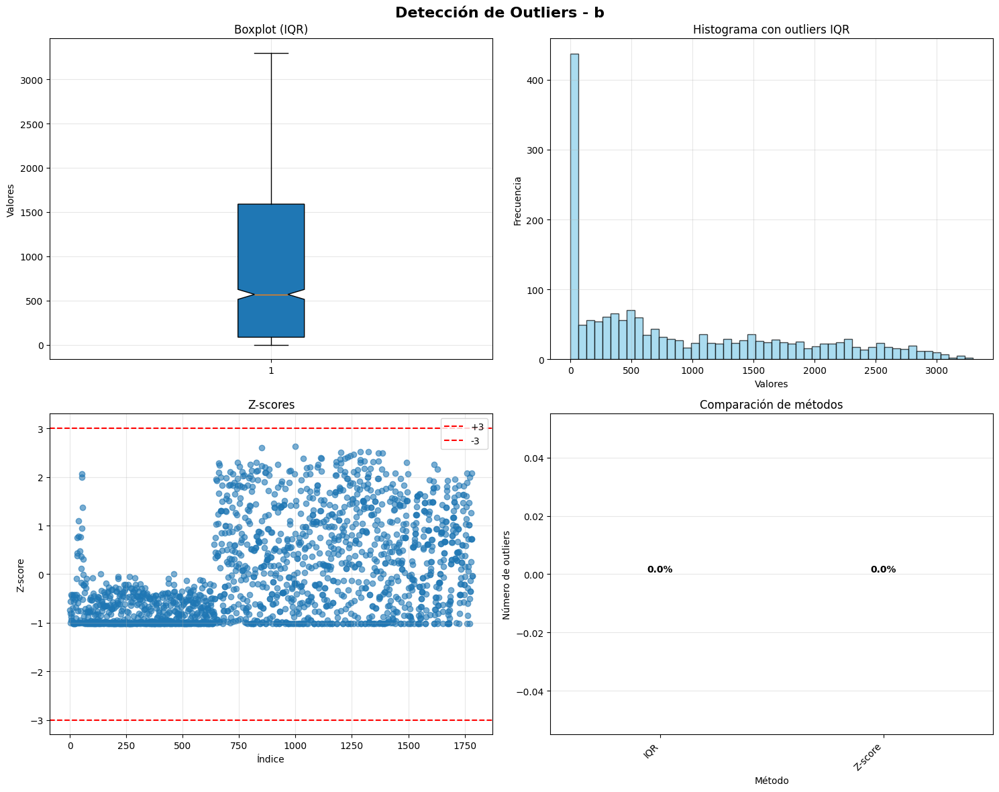

RESUMEN DE DETECCIÓN DE OUTLIERS - b
IQR:
   • Outliers detectados: 0
   • Porcentaje: 0.00%
   • Límite inferior: -2171.00
   • Límite superior: 3845.00

Z-score:
   • Outliers detectados: 0
   • Porcentaje: 0.00%
   • Umbral utilizado: 3

Outliers detectados por TODOS los métodos usados: 0


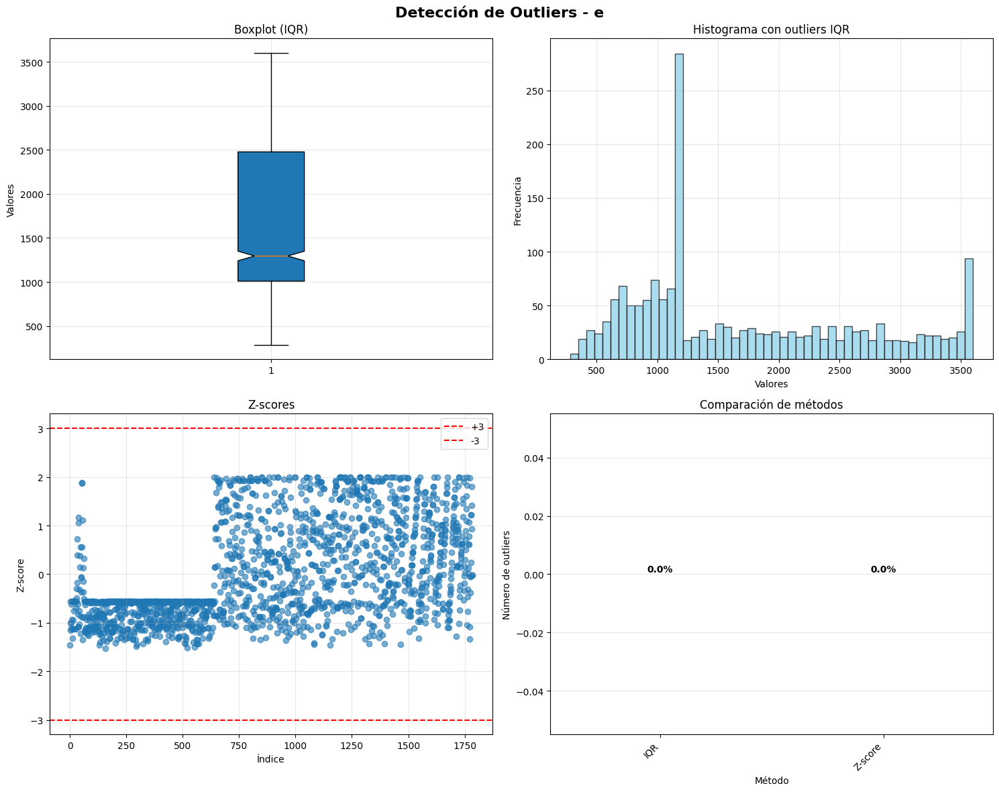

RESUMEN DE DETECCIÓN DE OUTLIERS - e
IQR:
   • Outliers detectados: 0
   • Porcentaje: 0.00%
   • Límite inferior: -1193.00
   • Límite superior: 4679.00

Z-score:
   • Outliers detectados: 0
   • Porcentaje: 0.00%
   • Umbral utilizado: 3

Outliers detectados por TODOS los métodos usados: 0


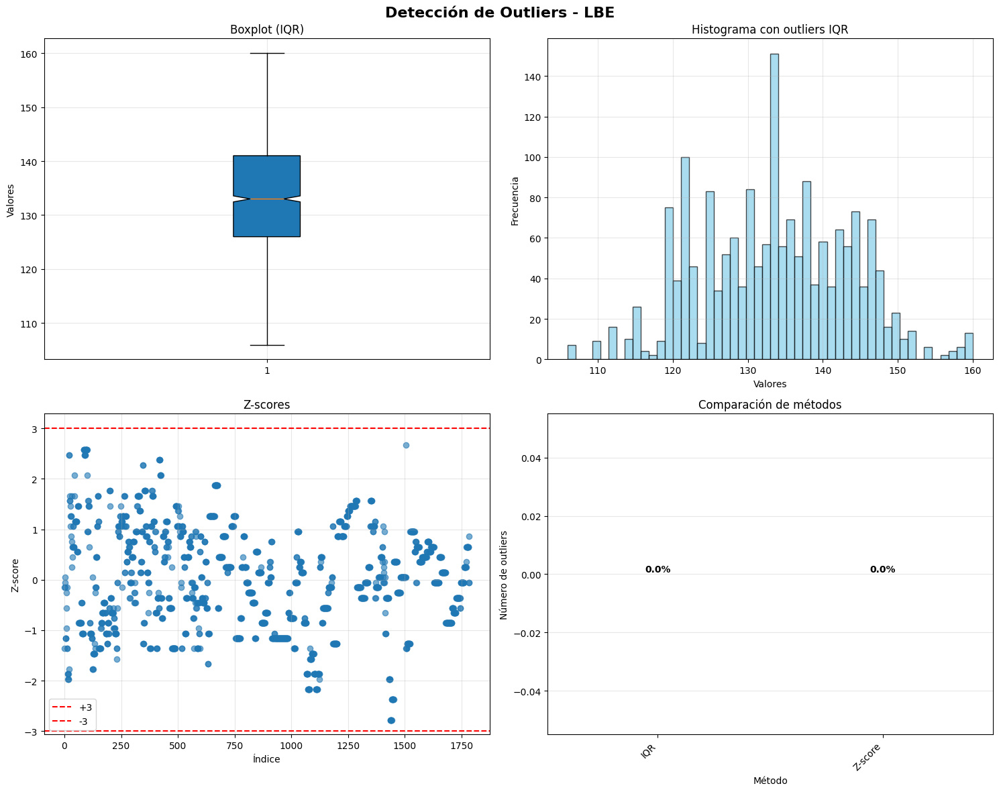

RESUMEN DE DETECCIÓN DE OUTLIERS - LBE
IQR:
   • Outliers detectados: 0
   • Porcentaje: 0.00%
   • Límite inferior: 103.50
   • Límite superior: 163.50

Z-score:
   • Outliers detectados: 0
   • Porcentaje: 0.00%
   • Umbral utilizado: 3

Outliers detectados por TODOS los métodos usados: 0


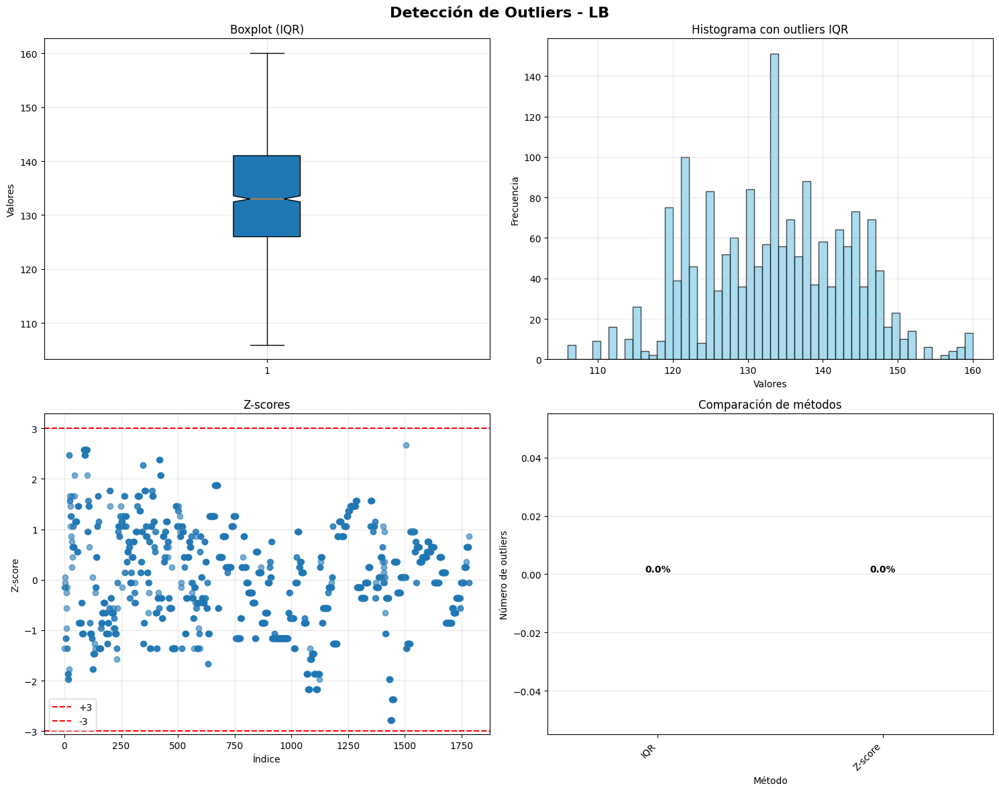

RESUMEN DE DETECCIÓN DE OUTLIERS - LB
IQR:
   • Outliers detectados: 0
   • Porcentaje: 0.00%
   • Límite inferior: 103.50
   • Límite superior: 163.50

Z-score:
   • Outliers detectados: 0
   • Porcentaje: 0.00%
   • Umbral utilizado: 3

Outliers detectados por TODOS los métodos usados: 0


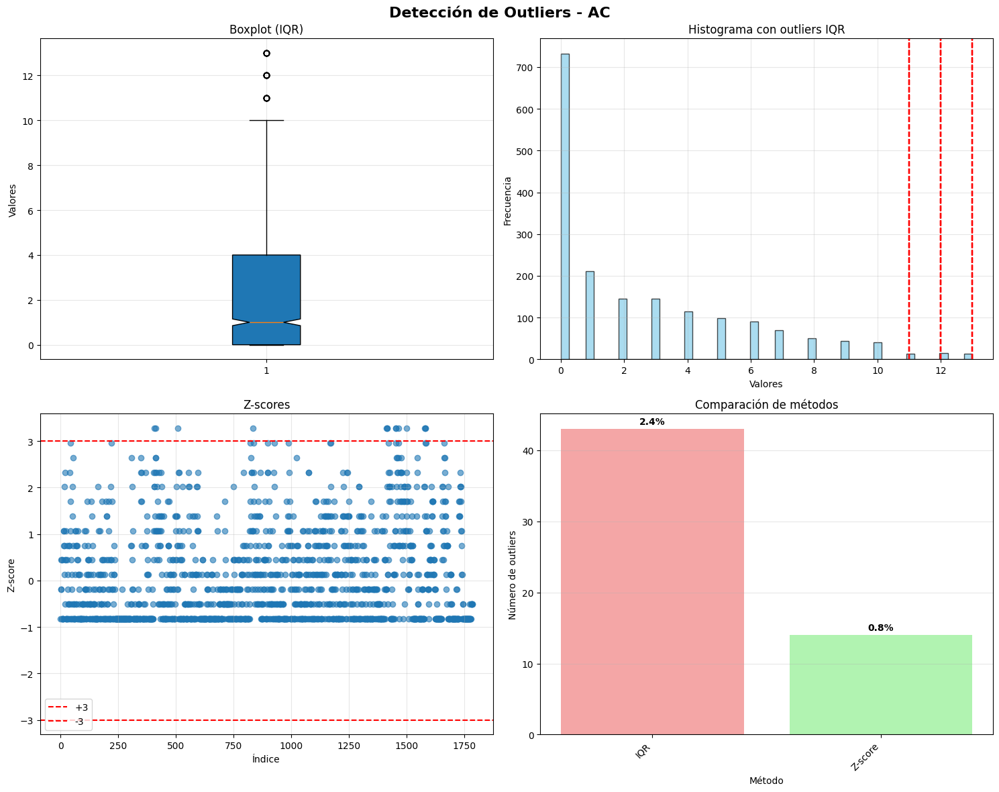

RESUMEN DE DETECCIÓN DE OUTLIERS - AC
IQR:
   • Outliers detectados: 43
   • Porcentaje: 2.41%
   • Límite inferior: -6.00
   • Límite superior: 10.00

Z-score:
   • Outliers detectados: 14
   • Porcentaje: 0.78%
   • Umbral utilizado: 3

Outliers detectados por TODOS los métodos usados: 14
   Índices: [490, 498, 616, 999, 1625, 1627, 1628, 1690, 1692, 1706, 1743, 1853, 1856, 1861]
   Valores: [np.float64(13.0), np.float64(13.0), np.float64(13.0), np.float64(13.0), np.float64(13.0), np.float64(13.0), np.float64(13.0), np.float64(13.0), np.float64(13.0), np.float64(13.0), np.float64(13.0), np.float64(13.0), np.float64(13.0), np.float64(13.0)]
   Valores únicos: [np.float64(13.0)]



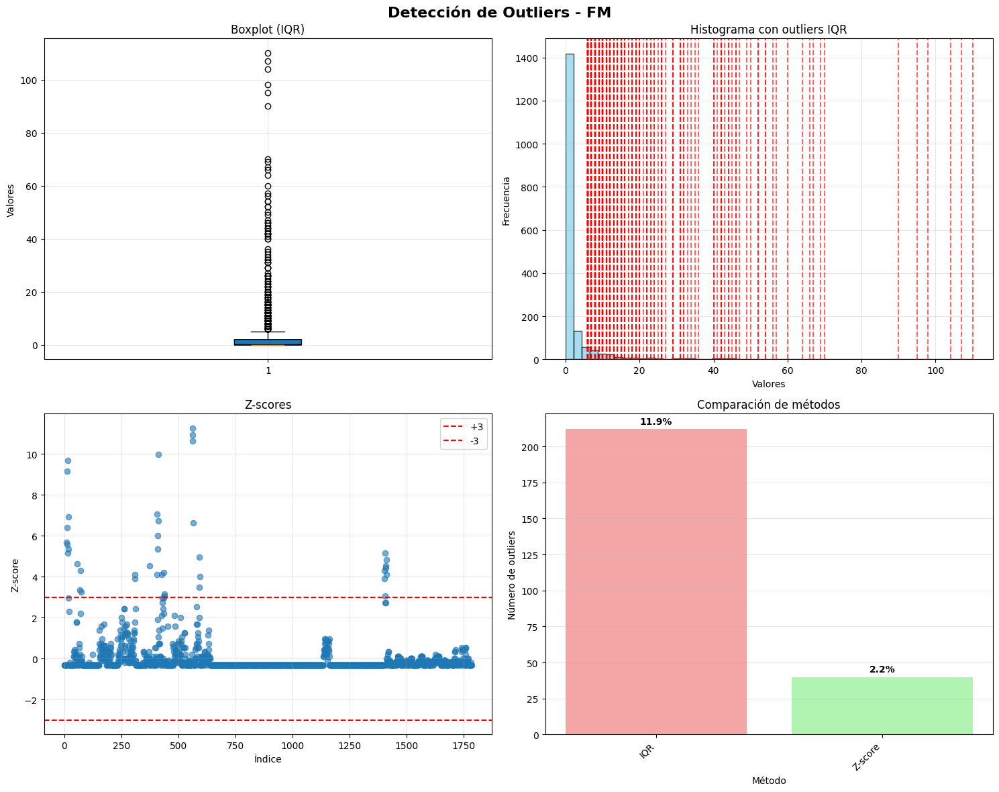

RESUMEN DE DETECCIÓN DE OUTLIERS - FM
IQR:
   • Outliers detectados: 212
   • Porcentaje: 11.88%
   • Límite inferior: -3.00
   • Límite superior: 5.00

Z-score:
   • Outliers detectados: 40
   • Porcentaje: 2.24%
   • Umbral utilizado: 3

Outliers detectados por TODOS los métodos usados: 40
   Índices: [12, 32, 34, 35, 36, 38, 39, 40, 87, 105, 108, 110, 381, 382, 456, 490, 491, 493, 497, 498, 499, 514, 527, 530, 531, 687, 702, 703, 704, 733, 735, 736, 1606, 1607, 1608, 1610, 1612, 1613, 1614, 1621]
   Valores: [np.float64(57.0), np.float64(64.0), np.float64(56.0), np.float64(90.0), np.float64(95.0), np.float64(52.0), np.float64(54.0), np.float64(69.0), np.float64(47.0), np.float64(35.0), np.float64(44.0), np.float64(34.0), np.float64(42.0), np.float64(40.0), np.float64(46.0), np.float64(70.0), np.float64(42.0), np.float64(60.0), np.float64(54.0), np.float64(98.0), np.float64(67.0), np.float64(42.0), np.float64(43.0), np.float64(32.0), np.float64(33.0), np.float64(104.0), np.float64(10

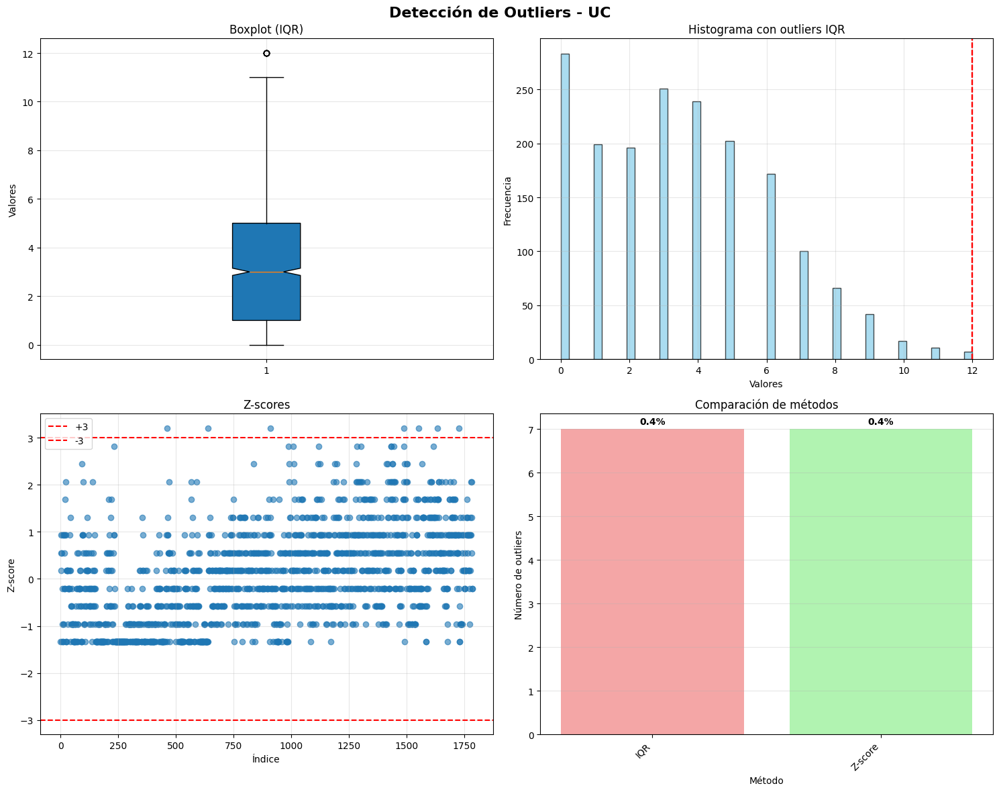

RESUMEN DE DETECCIÓN DE OUTLIERS - UC
IQR:
   • Outliers detectados: 7
   • Porcentaje: 0.39%
   • Límite inferior: -5.00
   • Límite superior: 11.00

Z-score:
   • Outliers detectados: 7
   • Porcentaje: 0.39%
   • Umbral utilizado: 3

Outliers detectados por TODOS los métodos usados: 7
   Índices: [561, 794, 1077, 1732, 1824, 1934, 2065]
   Valores: [np.float64(12.0), np.float64(12.0), np.float64(12.0), np.float64(12.0), np.float64(12.0), np.float64(12.0), np.float64(12.0)]
   Valores únicos: [np.float64(12.0)]



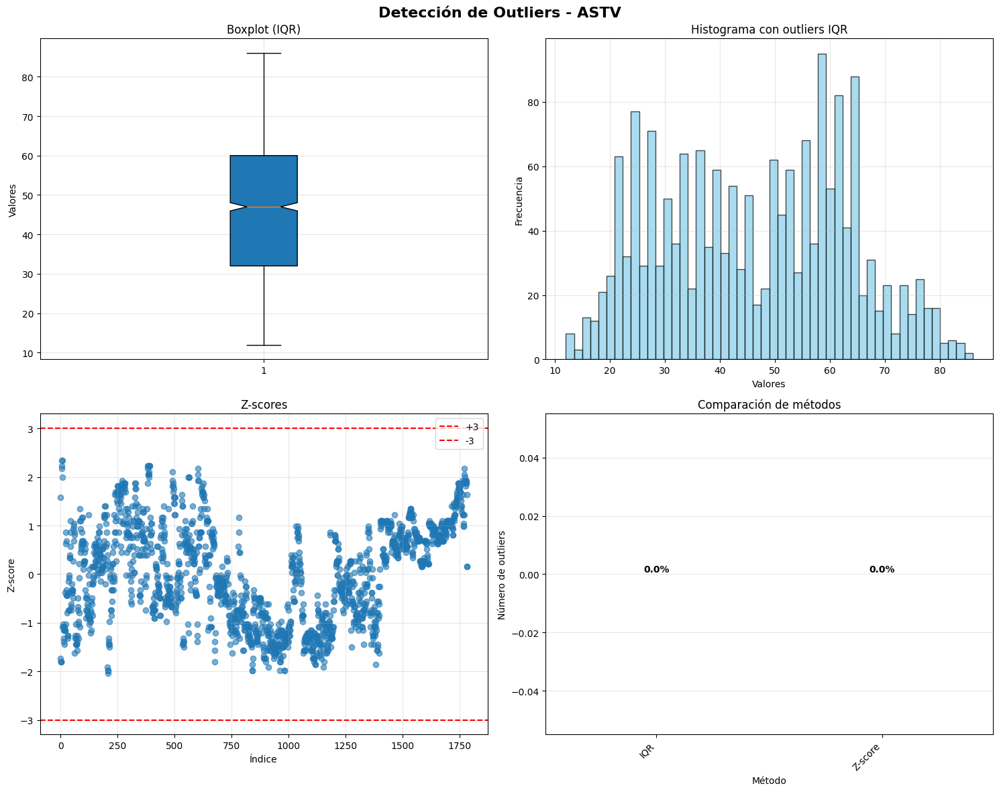

RESUMEN DE DETECCIÓN DE OUTLIERS - ASTV
IQR:
   • Outliers detectados: 0
   • Porcentaje: 0.00%
   • Límite inferior: -10.00
   • Límite superior: 102.00

Z-score:
   • Outliers detectados: 0
   • Porcentaje: 0.00%
   • Umbral utilizado: 3

Outliers detectados por TODOS los métodos usados: 0


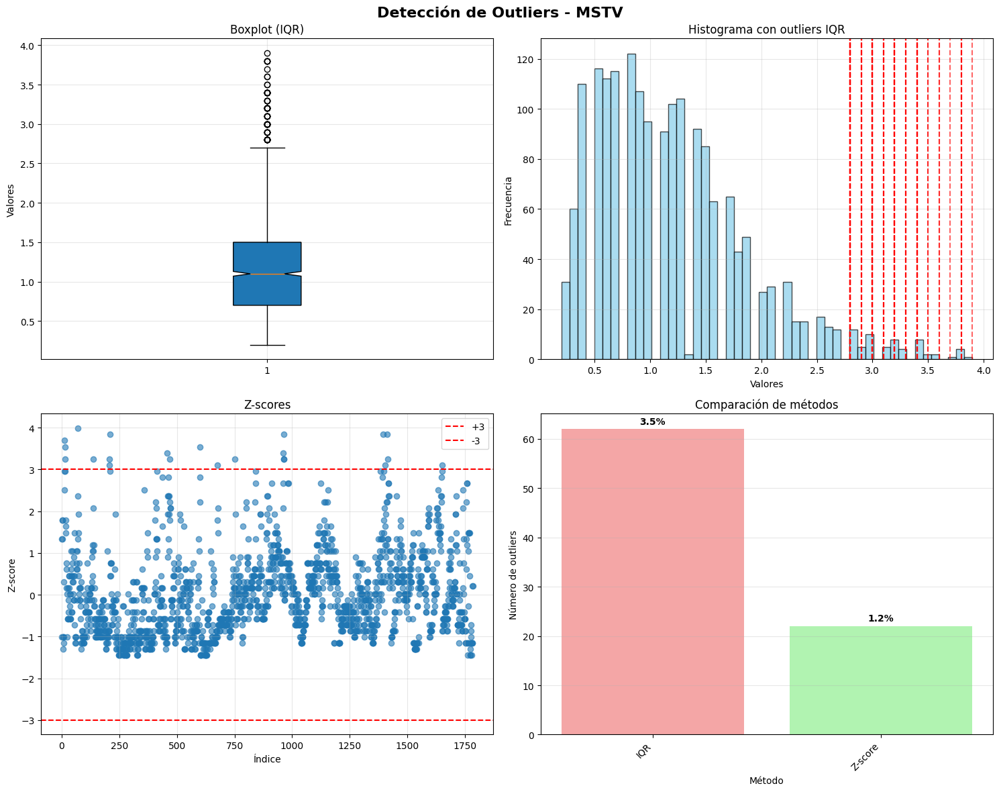

RESUMEN DE DETECCIÓN DE OUTLIERS - MSTV
IQR:
   • Outliers detectados: 62
   • Porcentaje: 3.47%
   • Límite inferior: -0.50
   • Límite superior: 2.70

Z-score:
   • Outliers detectados: 22
   • Porcentaje: 1.23%
   • Umbral utilizado: 3

Outliers detectados por TODOS los métodos usados: 22
   Índices: [35, 36, 38, 106, 185, 255, 256, 258, 556, 569, 745, 835, 910, 1132, 1133, 1134, 1135, 1597, 1609, 1621, 1629, 1954]
   Valores: [np.float64(3.7), np.float64(3.4), np.float64(3.6), np.float64(3.9), np.float64(3.4), np.float64(3.3), np.float64(3.4), np.float64(3.8), np.float64(3.5), np.float64(3.4), np.float64(3.6), np.float64(3.3), np.float64(3.4), np.float64(3.5), np.float64(3.8), np.float64(3.4), np.float64(3.4), np.float64(3.8), np.float64(3.3), np.float64(3.8), np.float64(3.4), np.float64(3.3)]
   Valores únicos: [np.float64(3.3), np.float64(3.4), np.float64(3.5), np.float64(3.6), np.float64(3.7), np.float64(3.8), np.float64(3.9)]



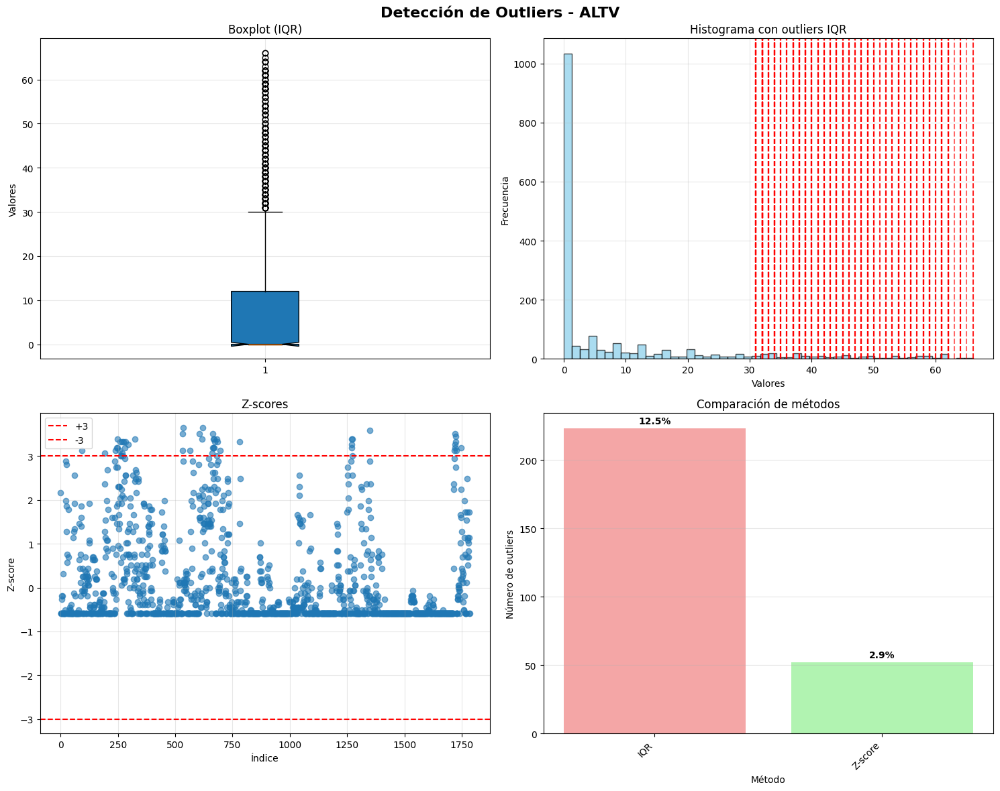

RESUMEN DE DETECCIÓN DE OUTLIERS - ALTV
IQR:
   • Outliers detectados: 223
   • Porcentaje: 12.49%
   • Límite inferior: -18.00
   • Límite superior: 30.00

Z-score:
   • Outliers detectados: 52
   • Porcentaje: 2.91%
   • Umbral utilizado: 3

Outliers detectados por TODOS los métodos usados: 52
   Índices: [132, 239, 289, 295, 299, 301, 311, 314, 316, 318, 326, 330, 331, 333, 345, 348, 366, 400, 647, 648, 649, 705, 750, 765, 774, 817, 819, 820, 822, 825, 828, 829, 831, 838, 839, 843, 854, 940, 1461, 1462, 1463, 1464, 1465, 1547, 2055, 2056, 2057, 2058, 2059, 2063, 2065, 2089]
   Valores: [np.float64(58.0), np.float64(57.0), np.float64(58.0), np.float64(59.0), np.float64(59.0), np.float64(62.0), np.float64(58.0), np.float64(61.0), np.float64(56.0), np.float64(56.0), np.float64(61.0), np.float64(57.0), np.float64(56.0), np.float64(61.0), np.float64(59.0), np.float64(61.0), np.float64(60.0), np.float64(62.0), np.float64(64.0), np.float64(58.0), np.float64(66.0), np.float64(58.0), np.floa

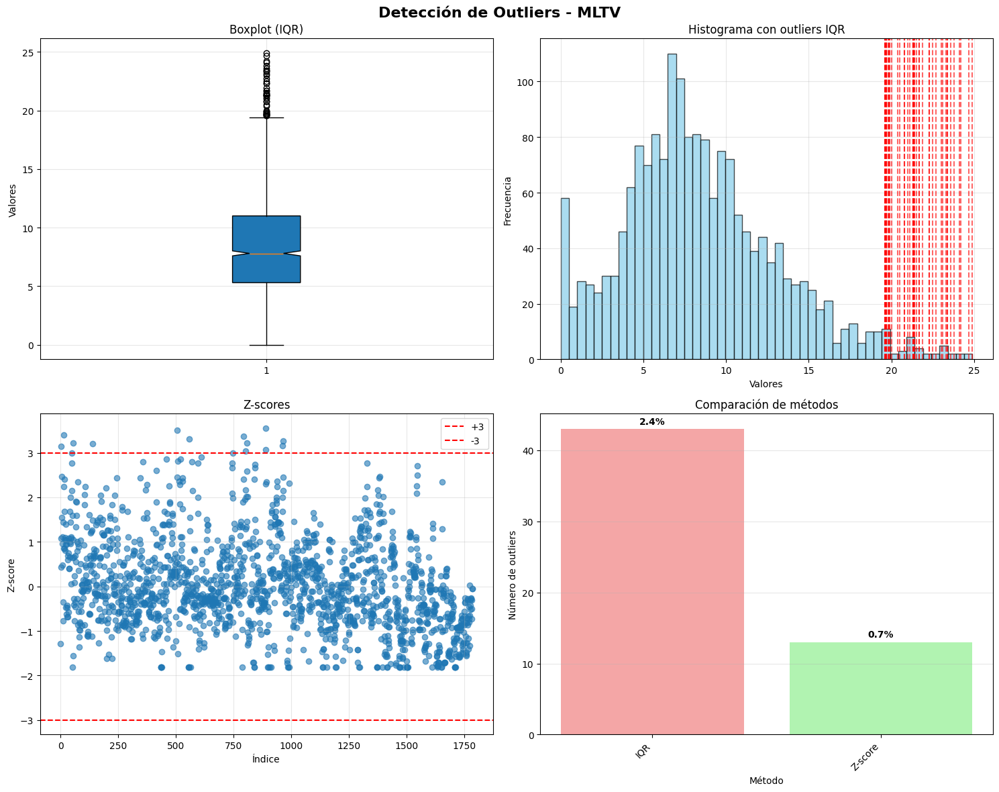

RESUMEN DE DETECCIÓN DE OUTLIERS - MLTV
IQR:
   • Outliers detectados: 43
   • Porcentaje: 2.41%
   • Límite inferior: -3.25
   • Límite superior: 19.55

Z-score:
   • Outliers detectados: 13
   • Porcentaje: 0.73%
   • Umbral utilizado: 3

Outliers detectados por TODOS los métodos usados: 13
   Índices: [3, 35, 86, 186, 610, 679, 951, 959, 966, 1055, 1056, 1132, 1133]
   Valores: [np.float64(23.0), np.float64(24.2), np.float64(23.4), np.float64(23.3), np.float64(24.7), np.float64(23.8), np.float64(24.1), np.float64(22.5), np.float64(23.4), np.float64(22.7), np.float64(24.9), np.float64(23.1), np.float64(23.6)]
   Valores únicos: [np.float64(22.5), np.float64(22.7), np.float64(23.0), np.float64(23.1), np.float64(23.3), np.float64(23.4), np.float64(23.6), np.float64(23.8), np.float64(24.1), np.float64(24.2), np.float64(24.7), np.float64(24.9)]



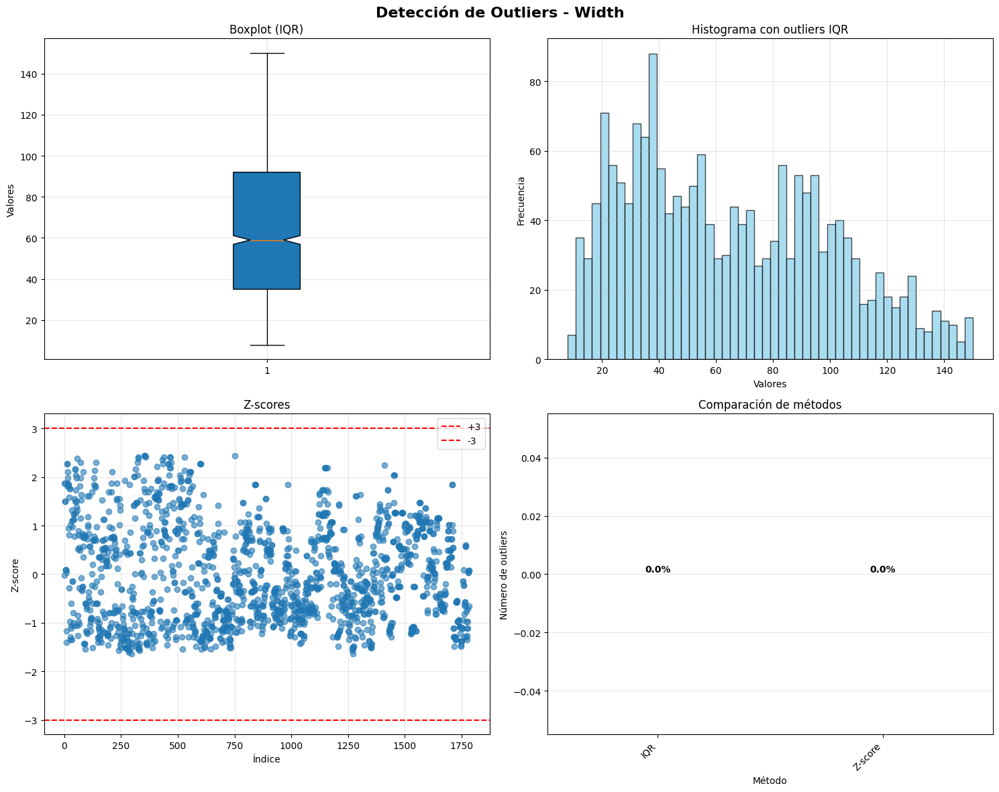

RESUMEN DE DETECCIÓN DE OUTLIERS - Width
IQR:
   • Outliers detectados: 0
   • Porcentaje: 0.00%
   • Límite inferior: -50.50
   • Límite superior: 177.50

Z-score:
   • Outliers detectados: 0
   • Porcentaje: 0.00%
   • Umbral utilizado: 3

Outliers detectados por TODOS los métodos usados: 0


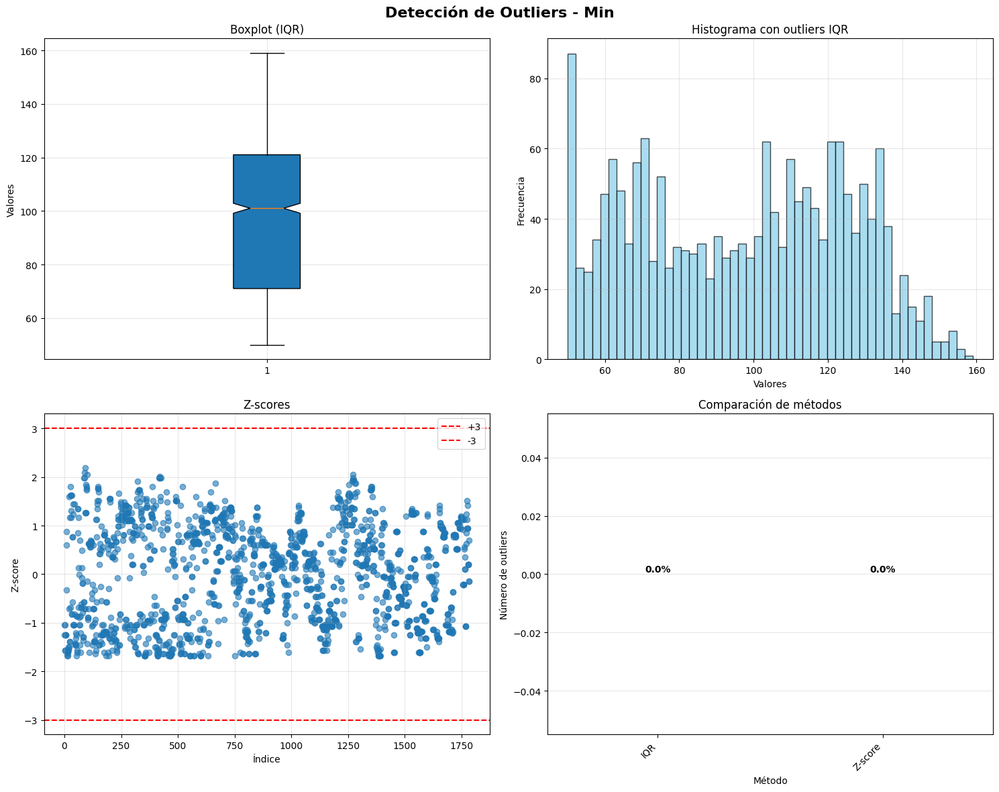

RESUMEN DE DETECCIÓN DE OUTLIERS - Min
IQR:
   • Outliers detectados: 0
   • Porcentaje: 0.00%
   • Límite inferior: -4.00
   • Límite superior: 196.00

Z-score:
   • Outliers detectados: 0
   • Porcentaje: 0.00%
   • Umbral utilizado: 3

Outliers detectados por TODOS los métodos usados: 0


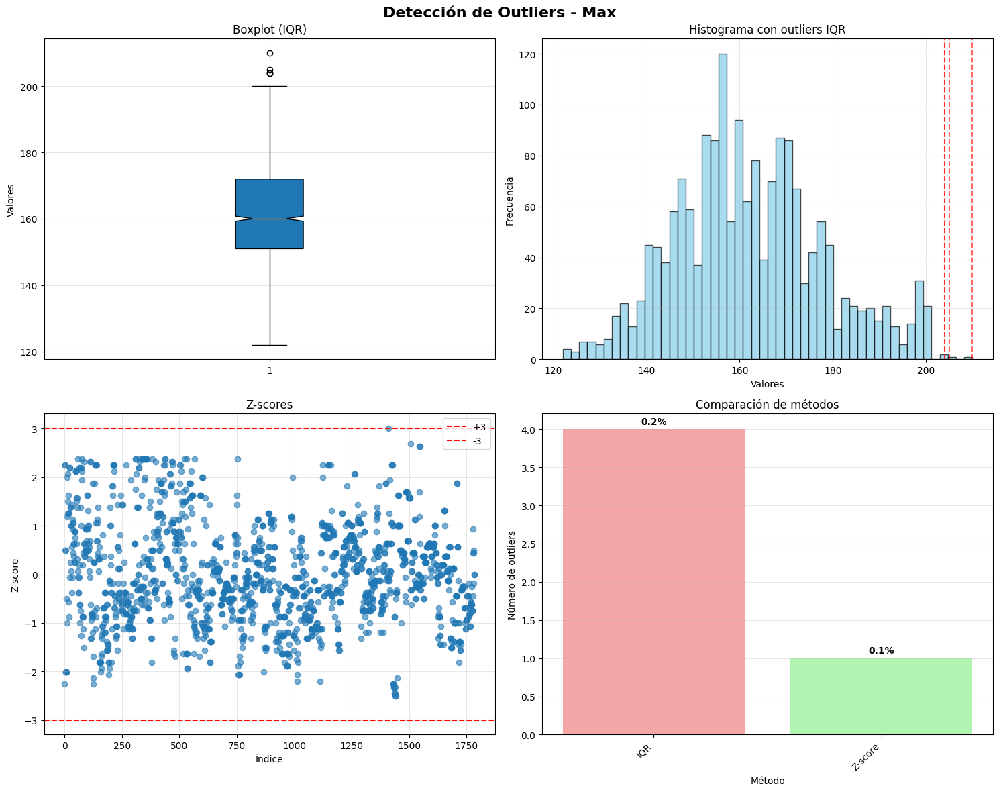

RESUMEN DE DETECCIÓN DE OUTLIERS - Max
IQR:
   • Outliers detectados: 4
   • Porcentaje: 0.22%
   • Límite inferior: 119.50
   • Límite superior: 203.50

Z-score:
   • Outliers detectados: 1
   • Porcentaje: 0.06%
   • Umbral utilizado: 3

Outliers detectados por TODOS los métodos usados: 1
   Índices: [1621]
   Valores: [np.float64(210.0)]
   Valores únicos: [np.float64(210.0)]



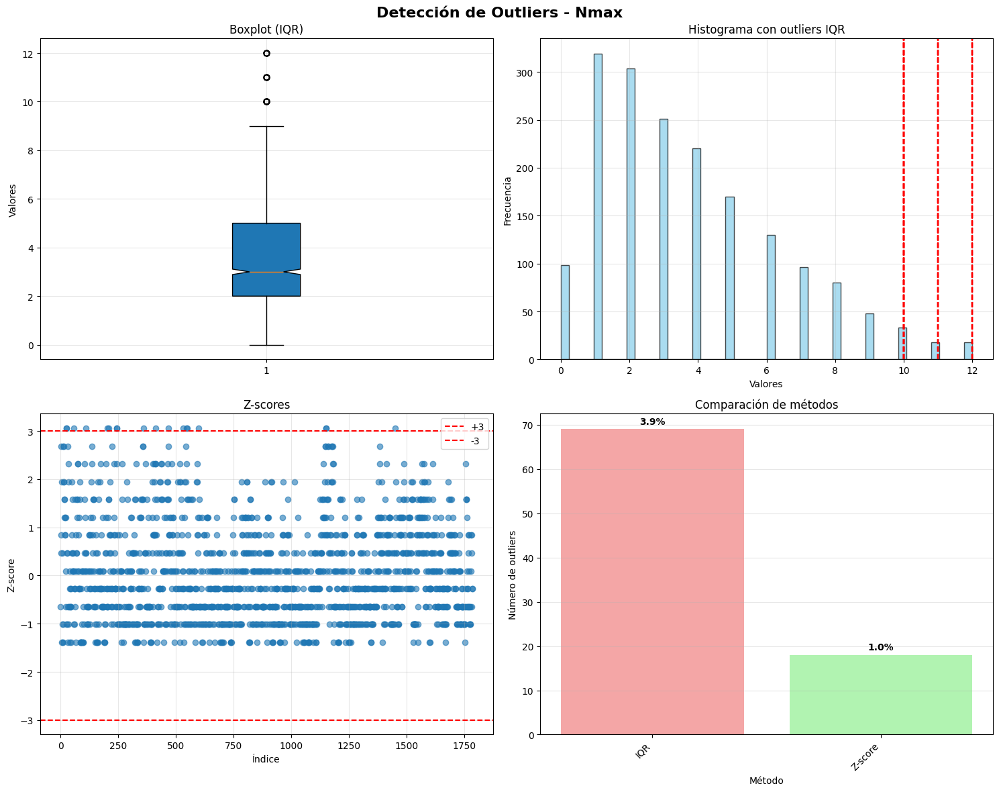

RESUMEN DE DETECCIÓN DE OUTLIERS - Nmax
IQR:
   • Outliers detectados: 69
   • Porcentaje: 3.87%
   • Límite inferior: -2.50
   • Límite superior: 9.50

Z-score:
   • Outliers detectados: 18
   • Porcentaje: 1.01%
   • Umbral utilizado: 3

Outliers detectados por TODOS los métodos usados: 18
   Índices: [55, 56, 89, 152, 251, 258, 291, 292, 440, 498, 568, 643, 665, 669, 745, 1331, 1332, 1675]
   Valores: [np.float64(12.0), np.float64(12.0), np.float64(12.0), np.float64(12.0), np.float64(12.0), np.float64(12.0), np.float64(12.0), np.float64(12.0), np.float64(12.0), np.float64(12.0), np.float64(12.0), np.float64(12.0), np.float64(12.0), np.float64(12.0), np.float64(12.0), np.float64(12.0), np.float64(12.0), np.float64(12.0)]
   Valores únicos: [np.float64(12.0)]



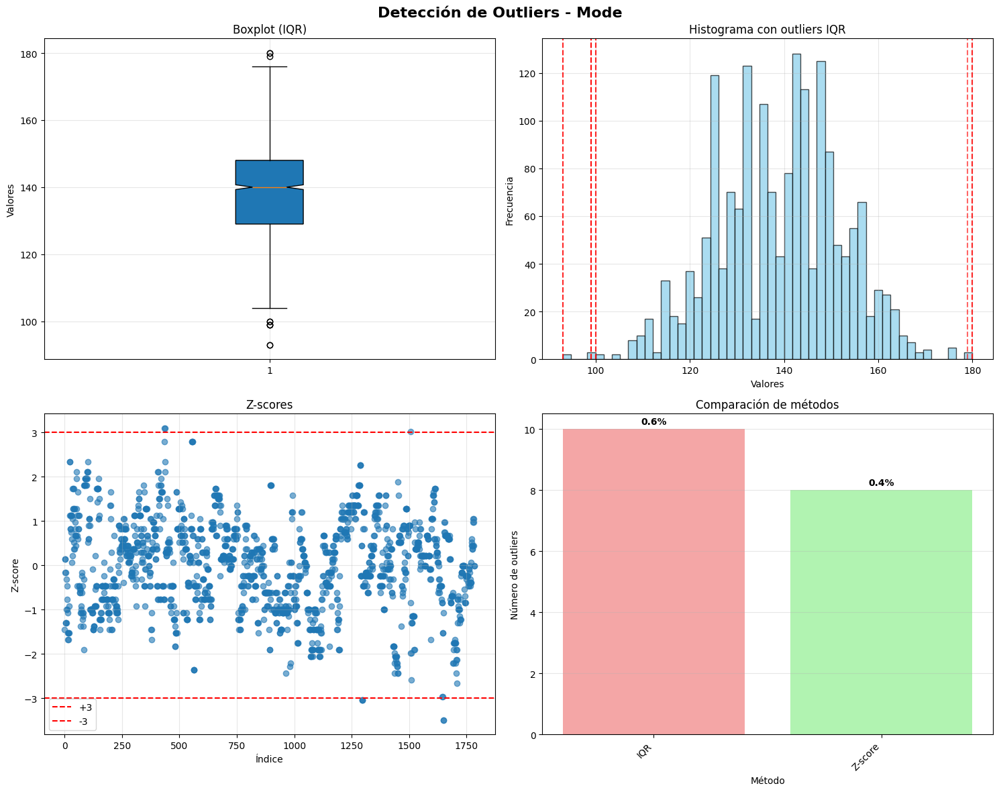

RESUMEN DE DETECCIÓN DE OUTLIERS - Mode
IQR:
   • Outliers detectados: 10
   • Porcentaje: 0.56%
   • Límite inferior: 100.50
   • Límite superior: 176.50

Z-score:
   • Outliers detectados: 8
   • Porcentaje: 0.45%
   • Umbral utilizado: 3

Outliers detectados por TODOS los métodos usados: 8
   Índices: [527, 531, 1489, 1491, 1492, 1757, 1950, 1951]
   Valores: [np.float64(180.0), np.float64(180.0), np.float64(99.0), np.float64(99.0), np.float64(99.0), np.float64(179.0), np.float64(93.0), np.float64(93.0)]
   Valores únicos: [np.float64(93.0), np.float64(99.0), np.float64(179.0), np.float64(180.0)]



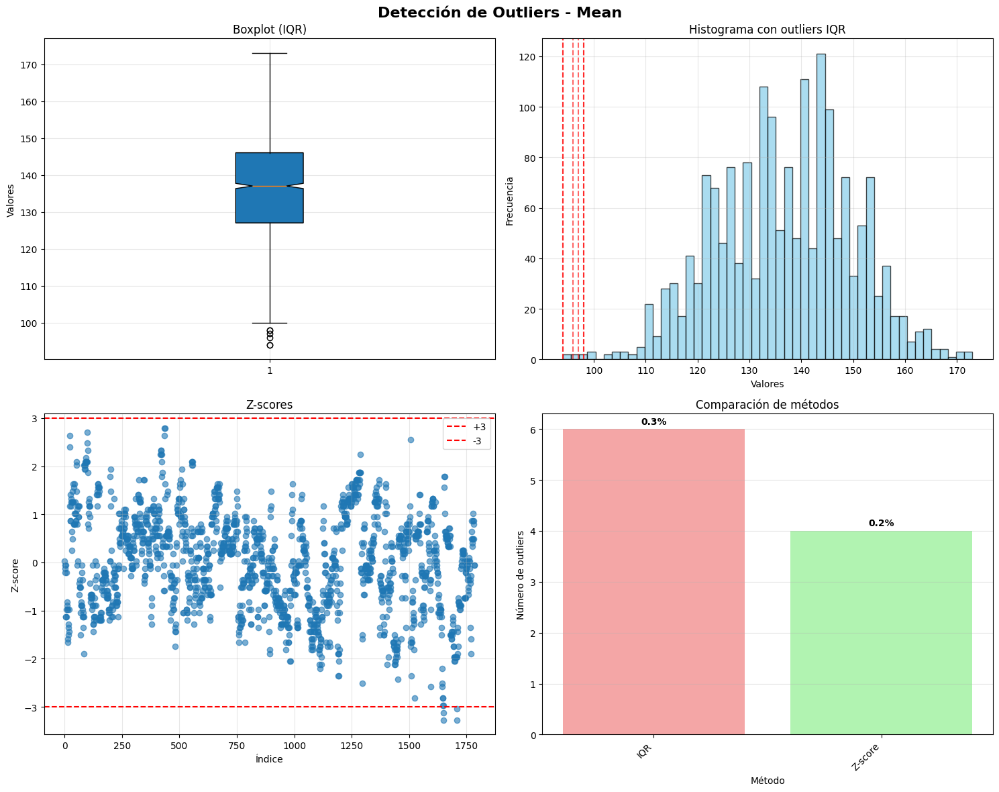

RESUMEN DE DETECCIÓN DE OUTLIERS - Mean
IQR:
   • Outliers detectados: 6
   • Porcentaje: 0.34%
   • Límite inferior: 98.50
   • Límite superior: 174.50

Z-score:
   • Outliers detectados: 4
   • Porcentaje: 0.22%
   • Umbral utilizado: 3

Outliers detectados por TODOS los métodos usados: 4
   Índices: [1951, 1954, 2038, 2039]
   Valores: [np.float64(94.0), np.float64(96.0), np.float64(94.0), np.float64(97.0)]
   Valores únicos: [np.float64(94.0), np.float64(96.0), np.float64(97.0)]



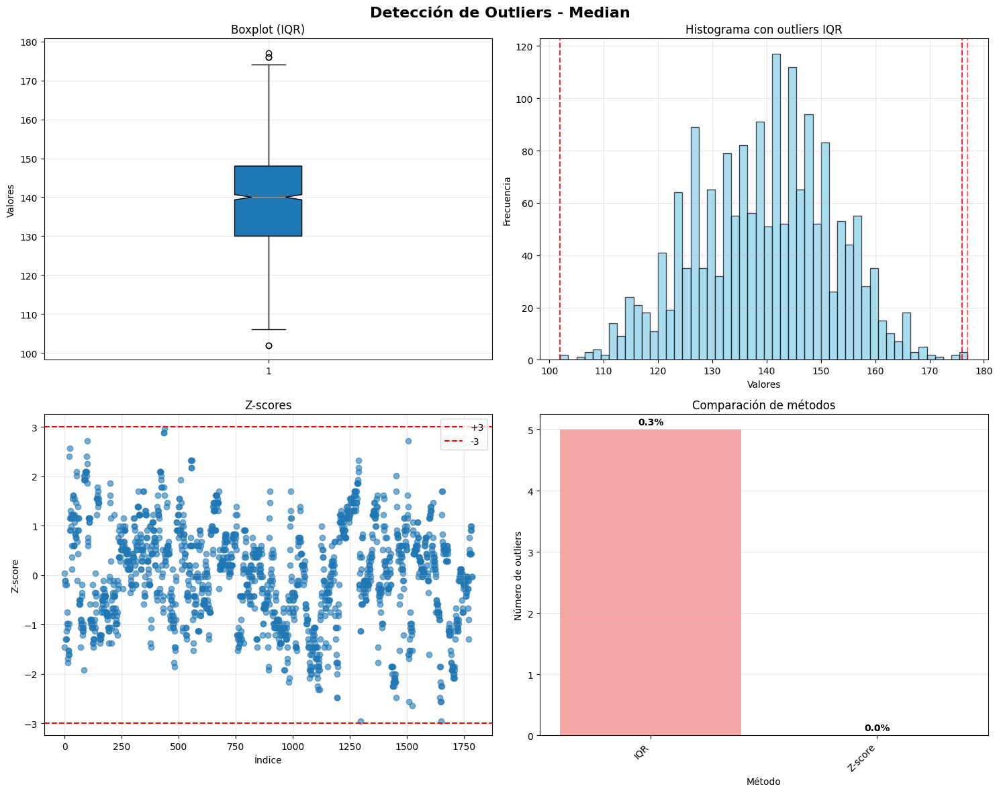

RESUMEN DE DETECCIÓN DE OUTLIERS - Median
IQR:
   • Outliers detectados: 5
   • Porcentaje: 0.28%
   • Límite inferior: 103.00
   • Límite superior: 175.00

Z-score:
   • Outliers detectados: 0
   • Porcentaje: 0.00%
   • Umbral utilizado: 3

Outliers detectados por TODOS los métodos usados: 0


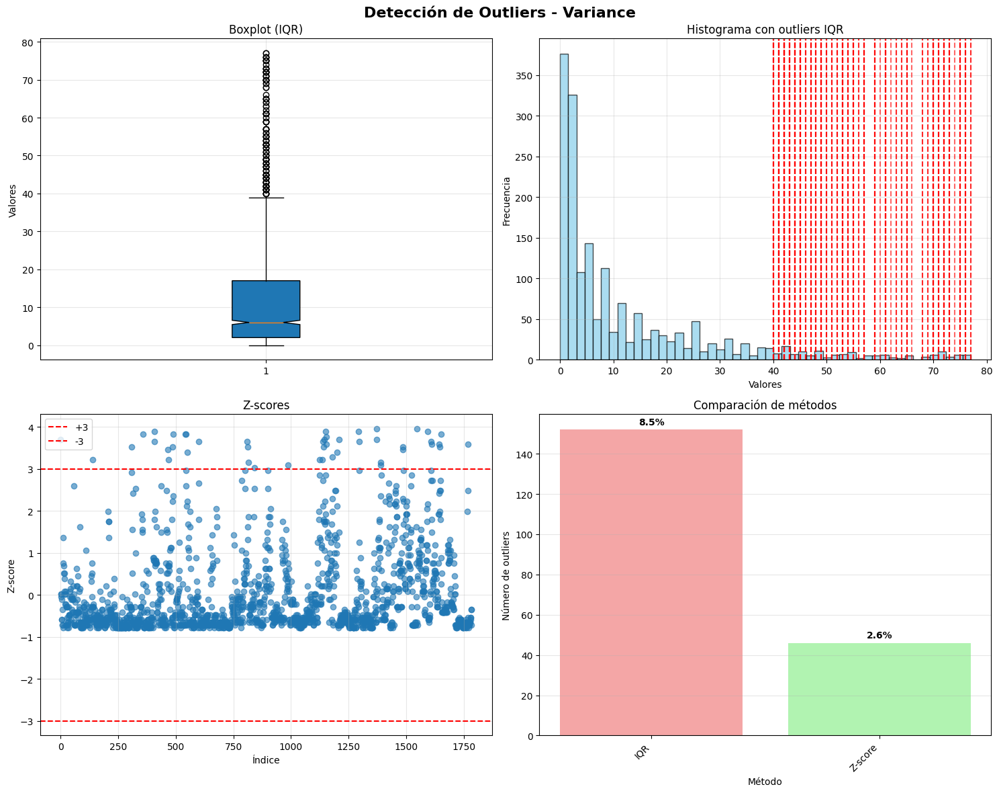

RESUMEN DE DETECCIÓN DE OUTLIERS - Variance
IQR:
   • Outliers detectados: 152
   • Porcentaje: 8.52%
   • Límite inferior: -20.50
   • Límite superior: 39.50

Z-score:
   • Outliers detectados: 46
   • Porcentaje: 2.58%
   • Umbral utilizado: 3

Outliers detectados por TODOS los métodos usados: 46
   Índices: [0, 185, 382, 439, 490, 491, 563, 569, 591, 592, 662, 663, 670, 745, 971, 973, 980, 1007, 1158, 1299, 1314, 1318, 1321, 1326, 1333, 1335, 1338, 1368, 1388, 1397, 1487, 1489, 1569, 1570, 1593, 1594, 1729, 1730, 1819, 1881, 1893, 1899, 1945, 1946, 1954, 2111]
   Valores: [np.float64(73.0), np.float64(65.0), np.float64(70.0), np.float64(75.0), np.float64(72.0), np.float64(76.0), np.float64(69.0), np.float64(65.0), np.float64(70.0), np.float64(75.0), np.float64(75.0), np.float64(75.0), np.float64(68.0), np.float64(72.0), np.float64(72.0), np.float64(70.0), np.float64(64.0), np.float64(62.0), np.float64(63.0), np.float64(65.0), np.float64(65.0), np.float64(72.0), np.float64(70.0), np.

In [23]:
for column in clasificar_columnas_continuas_discretas(data_clean)['continuas']:

    series = data_clean[column]

    detect_outliers(
        data=series, 
        methods=['iqr', 'zscore'],
        z_threshold=3,
        iqr_factor=1.5,
        plot=True,
        return_details=False
    )

## 2.- Análisis de Datos

### Clasificar automáticamente columnas

- Continuas (más de 10 valores únicos y tipo numérico)
- Discretas (menos o igual a 10 valores únicos)

In [24]:
check_data_completeness_juan_miguel_galan_olivares(data_clean)

,Num_nulls,%_completeness,dtype,mean,std,min,25%,50%,75%,max
FileName,0,100.00,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Date,2,99.89,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SegFile,0,100.00,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN
b,0,100.00,float64,915.147271,906.651139,0.0,85.0,569.0,1589.0,3296.0
e,0,100.00,float64,1722.149442,941.197147,287.0,1009.0,1295.0,2477.0,3599.0
LBE,0,100.00,float64,133.527731,9.902351,106.0,126.0,133.0,141.0,160.0
LB,0,100.00,float64,133.527731,9.902351,106.0,126.0,133.0,141.0,160.0
AC,0,100.00,float64,2.594958,3.179439,0.0,0.0,1.0,4.0,13.0
FM,0,100.00,float64,2.929412,9.519131,0.0,0.0,0.0,2.0,110.0
UC,0,100.00,float64,3.542297,2.644380,0.0,1.0,3.0,5.0,12.0


In [25]:
variables_discretas = clasificar_columnas_continuas_discretas(data_clean)['discretas']
variables_discretas

['DL',
 'DS',
 'DP',
 'DR',
 'Nzeros',
 'Tendency',
 'A',
 'B',
 'C',
 'D',
 'E',
 'AD',
 'DE',
 'LD',
 'FS',
 'SUSP',
 'CLASS',
 'NSP']

In [26]:
variables_continuas = clasificar_columnas_continuas_discretas(data_clean)['continuas']
variables_continuas

['b',
 'e',
 'LBE',
 'LB',
 'AC',
 'FM',
 'UC',
 'ASTV',
 'MSTV',
 'ALTV',
 'MLTV',
 'Width',
 'Min',
 'Max',
 'Nmax',
 'Mode',
 'Mean',
 'Median',
 'Variance']

In [27]:
clasificar_columnas_continuas_discretas(data_clean)['alta_cardinalidad']

['FileName', 'Date', 'SegFile']

## 3.- Visualizaciones

In [28]:
# Filtrar columnas numéricas cuya media no sea cero
numeric_cols = data_clean.select_dtypes(include=['number']).columns
cols_with_nonzero_mean = [col for col in numeric_cols if data_clean[col].mean() != 0]

print(f"Columnas con media diferente de cero: {len(cols_with_nonzero_mean)}")
print(cols_with_nonzero_mean)

Columnas con media diferente de cero: 36
['b', 'e', 'LBE', 'LB', 'AC', 'FM', 'UC', 'ASTV', 'MSTV', 'ALTV', 'MLTV', 'DL', 'DS', 'DP', 'Width', 'Min', 'Max', 'Nmax', 'Nzeros', 'Mode', 'Mean', 'Median', 'Variance', 'Tendency', 'A', 'B', 'C', 'D', 'E', 'AD', 'DE', 'LD', 'FS', 'SUSP', 'CLASS', 'NSP']


In [29]:
data_clean['Date_Formato'] = pd.to_datetime(data_clean['Date'], format='mixed')

In [30]:
# Extraer el año de la columna Date_Prueba
data_clean['Year'] = data_clean['Date_Formato'].dt.year

# Contar cuántos datos hay por año
datos_por_año = data_clean['Year'].value_counts().sort_index()
datos_por_año

Year
1980.0      47
1995.0     215
1996.0    1085
1997.0     241
1998.0     195
Name: count, dtype: int64

#### Histograma (Variables continuas)

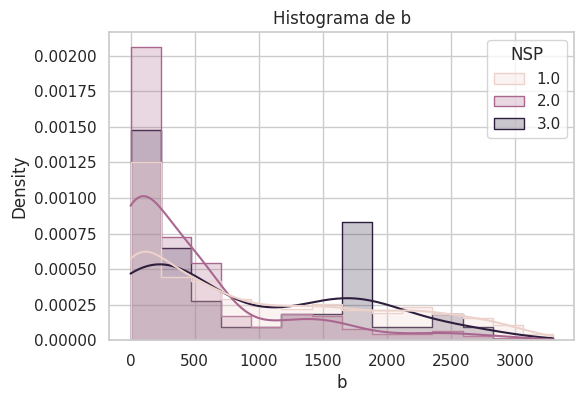

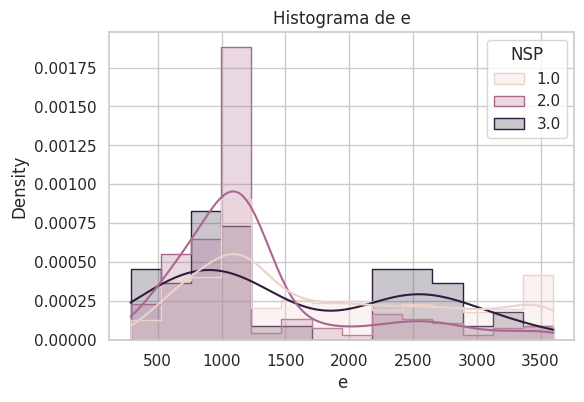

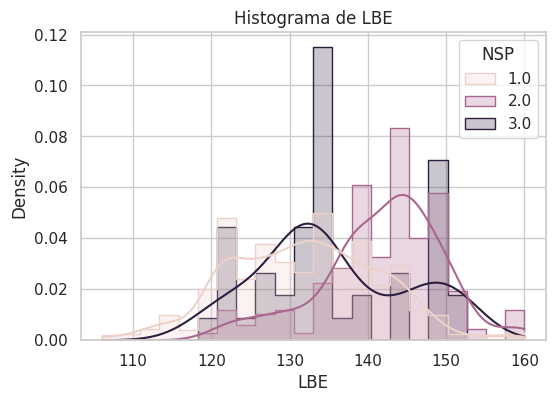

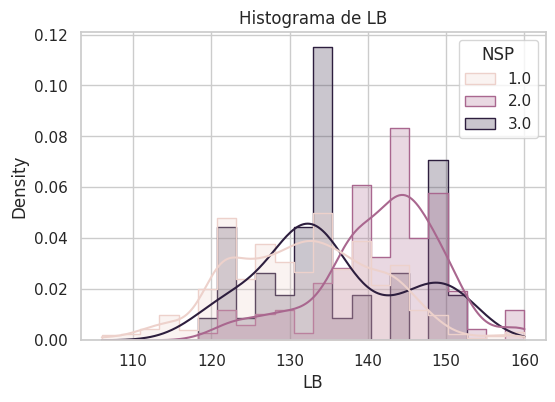

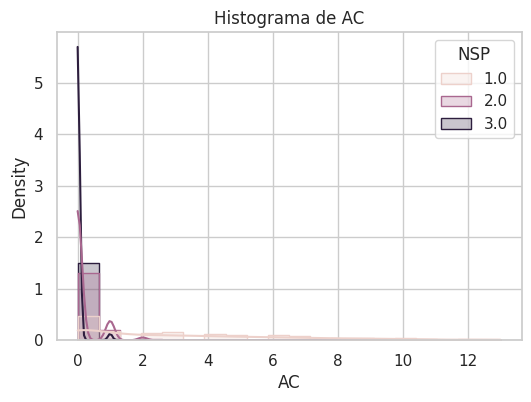

...

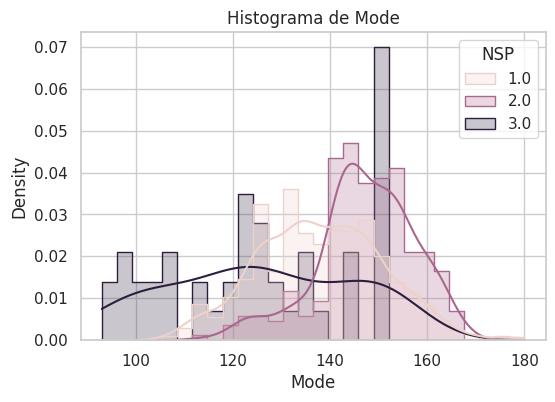

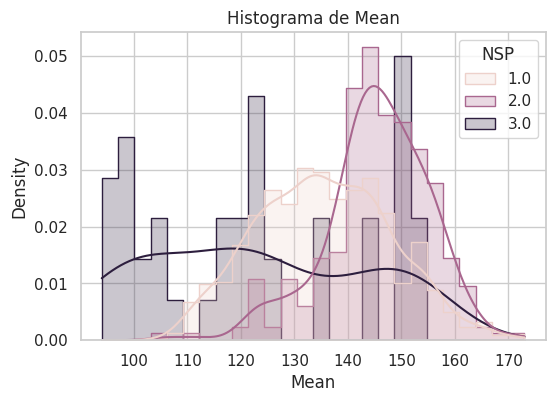

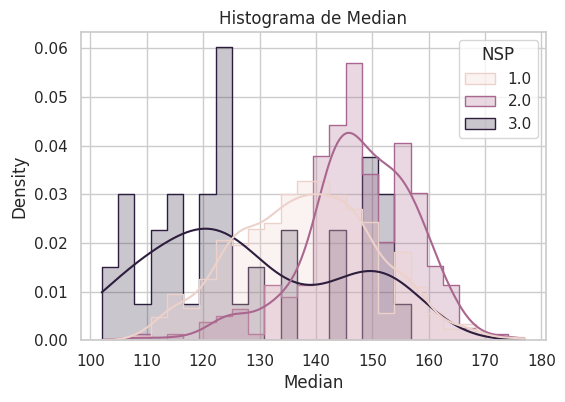

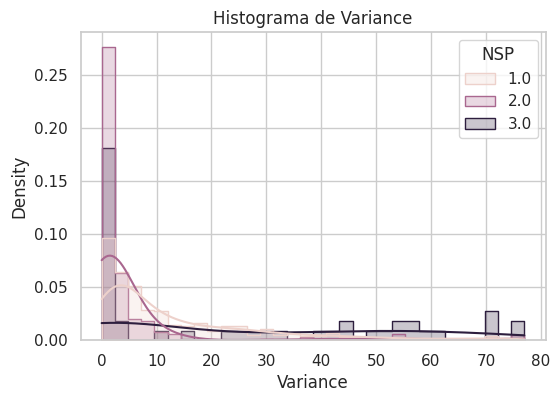

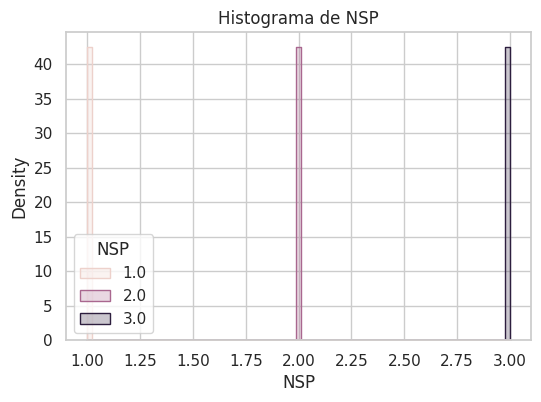

In [31]:
plot_histograms(data_clean[variables_continuas + ['NSP']], target_col="NSP", show=True)

#### Boxplots

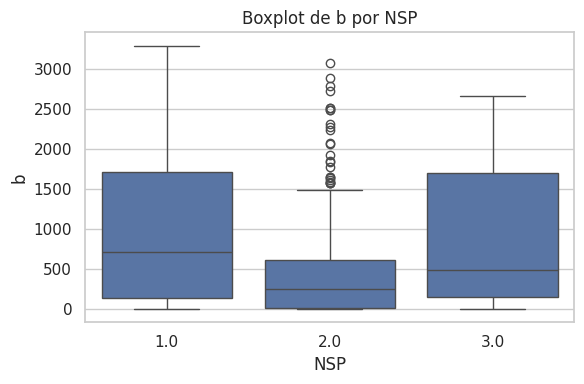

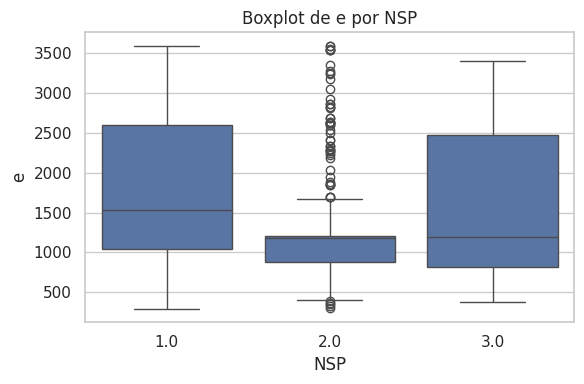

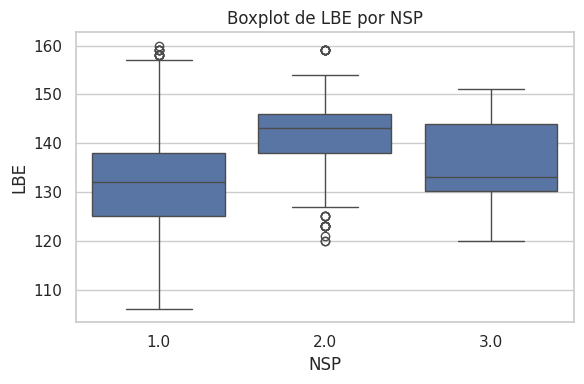

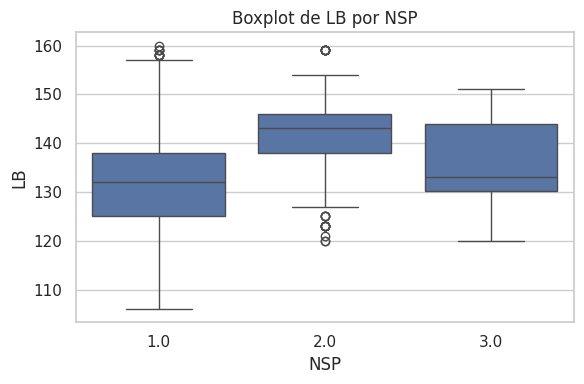

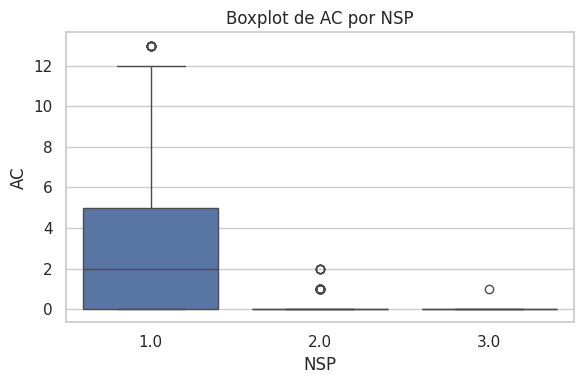

...

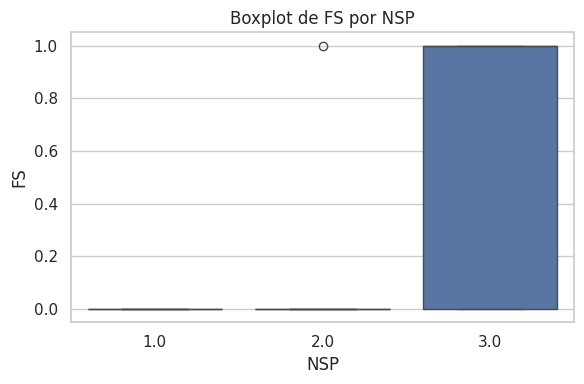

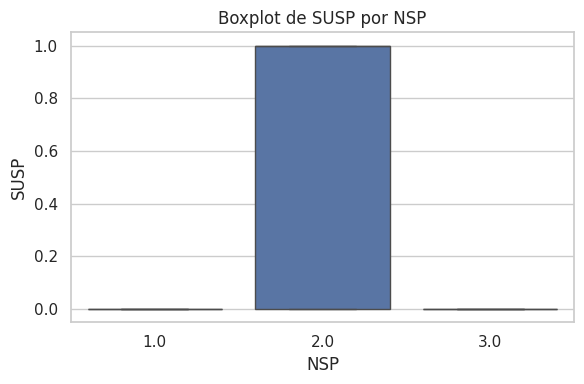

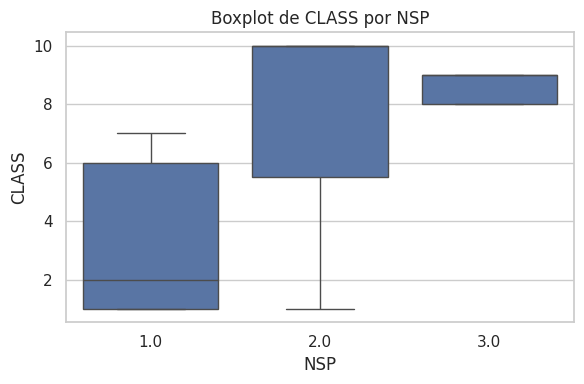

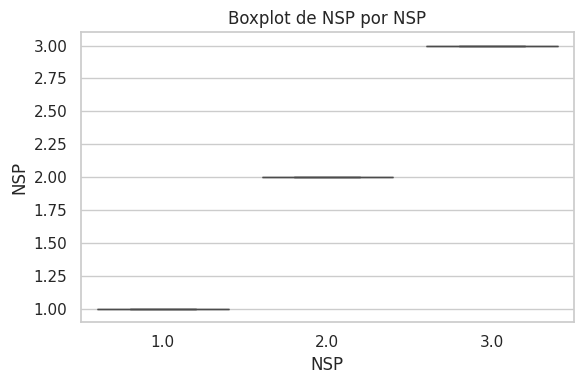

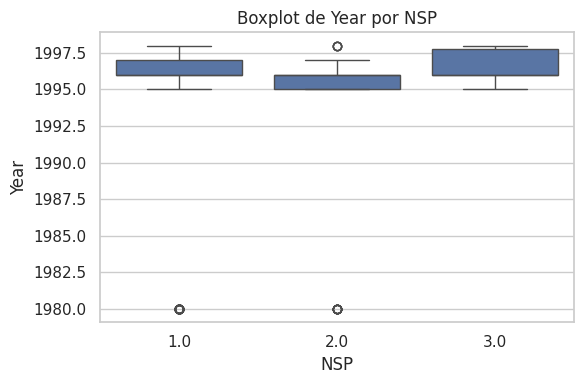

In [32]:
plot_boxplots(data_clean, target_col="NSP", show=True)

#### Barras Horizontales (variables discretas)

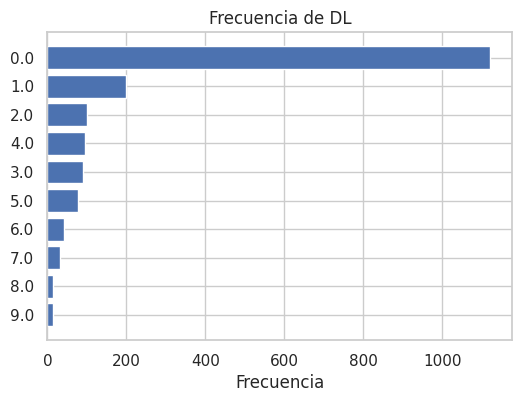

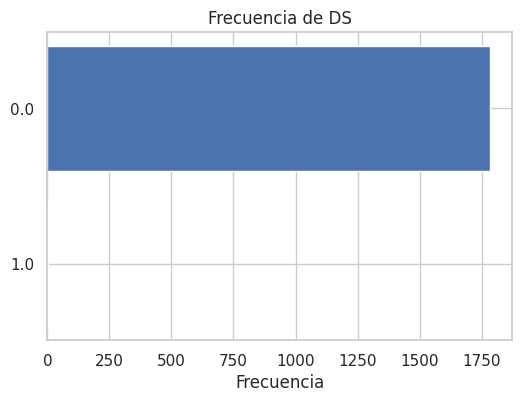

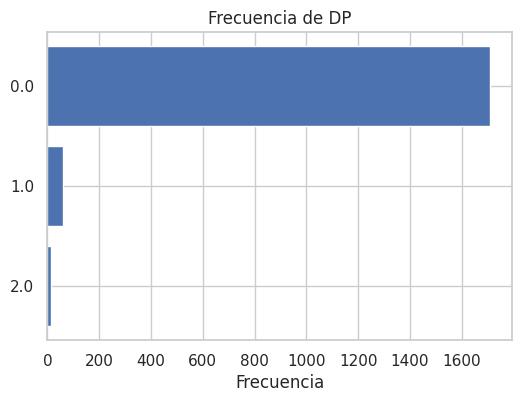

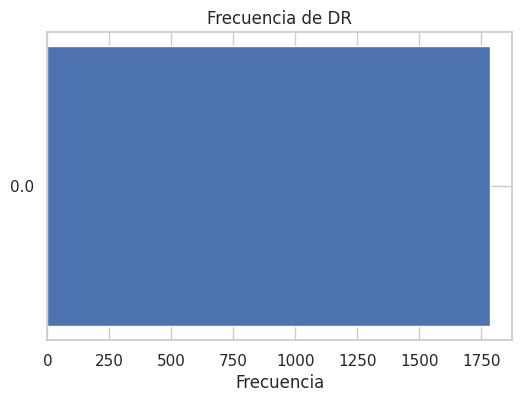

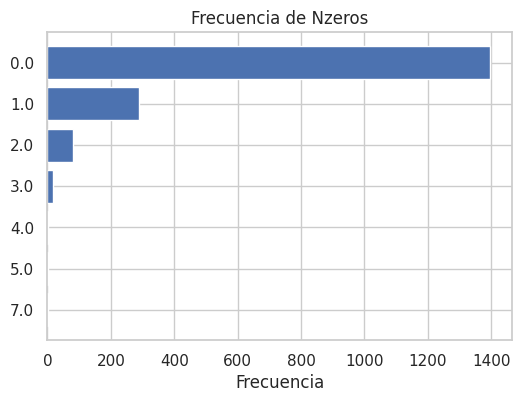

...

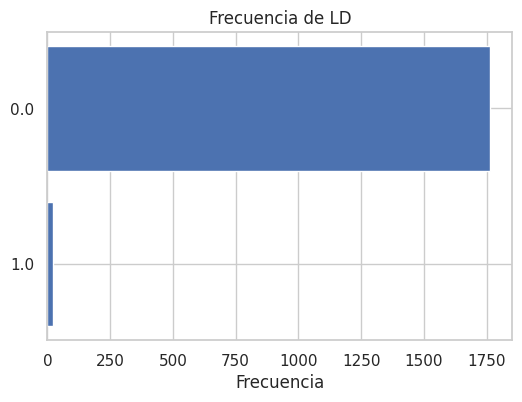

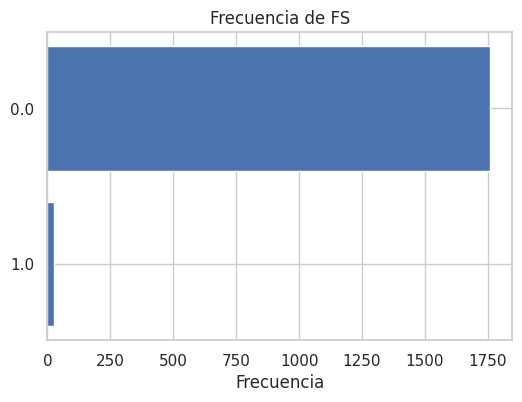

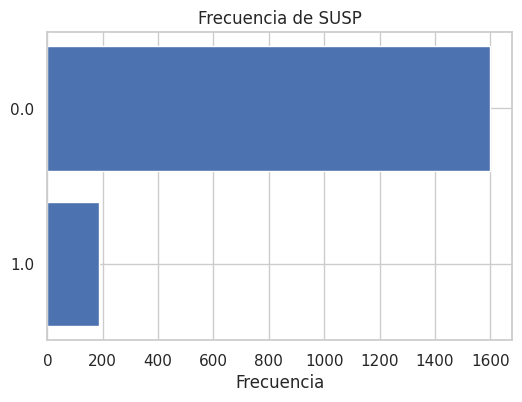

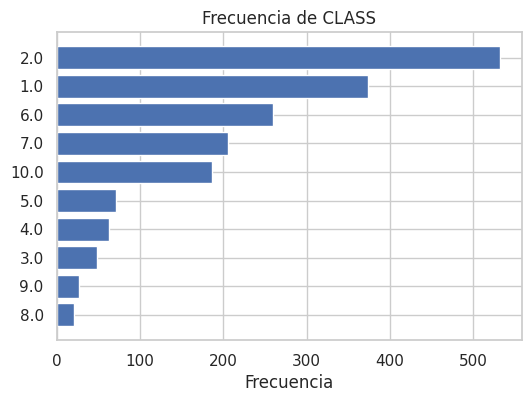

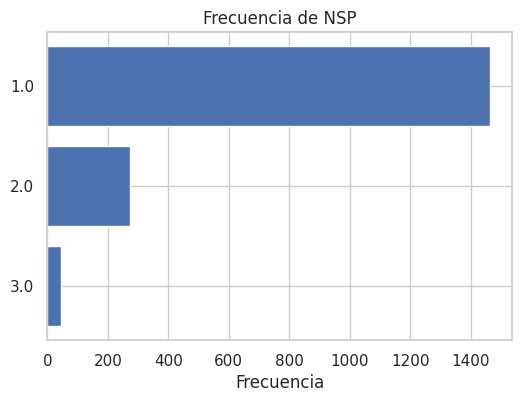

In [33]:
plot_barplots(data_clean[variables_discretas], show=True)

#### Lineas

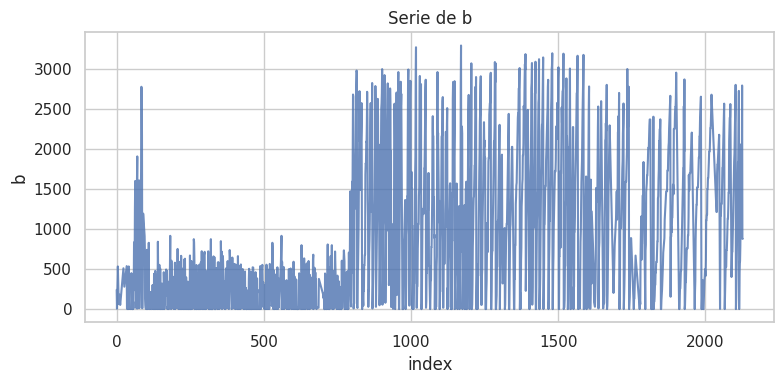

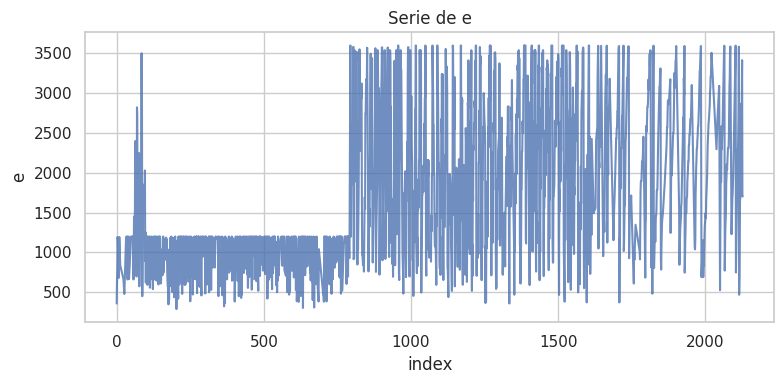

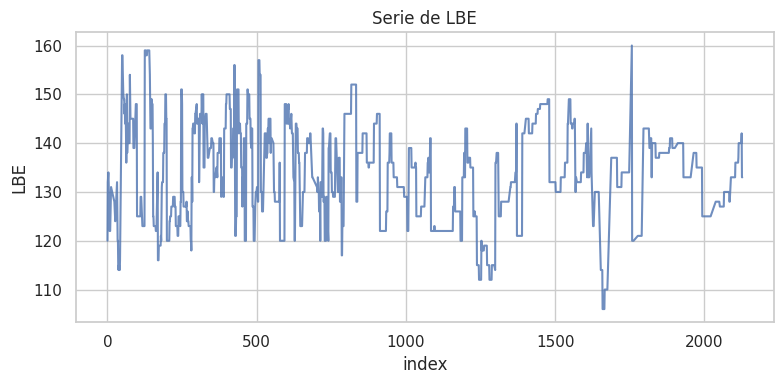

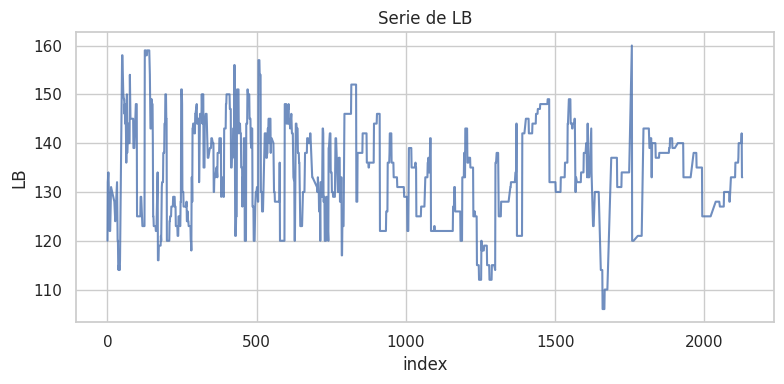

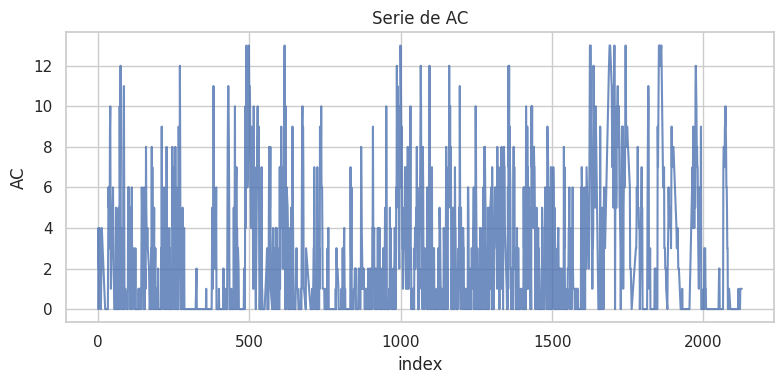

...

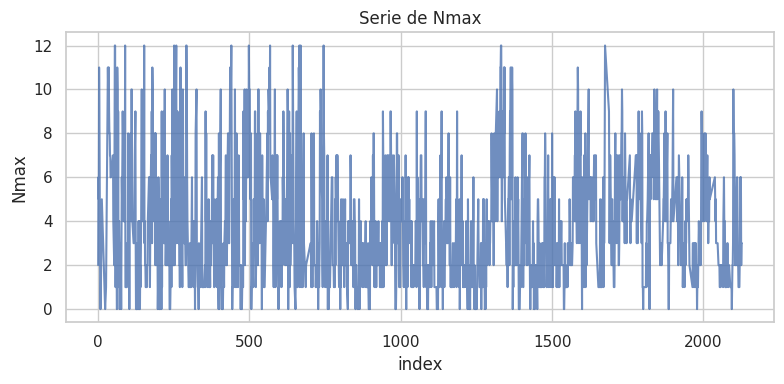

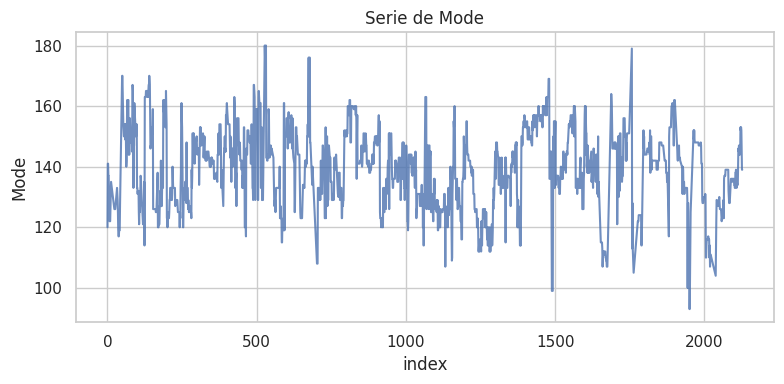

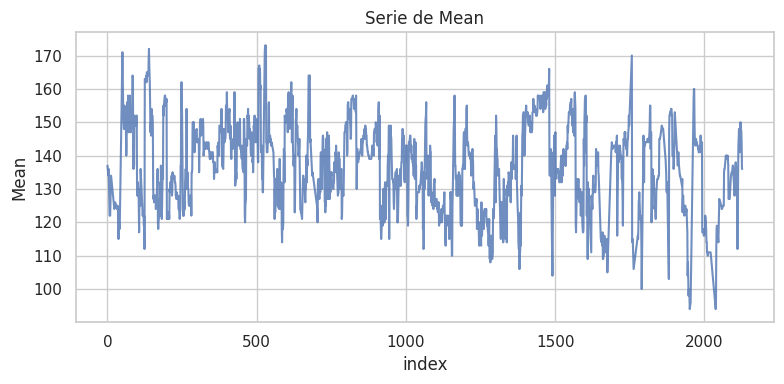

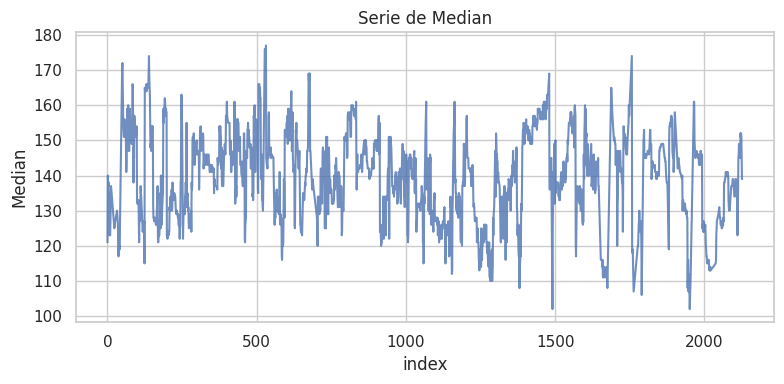

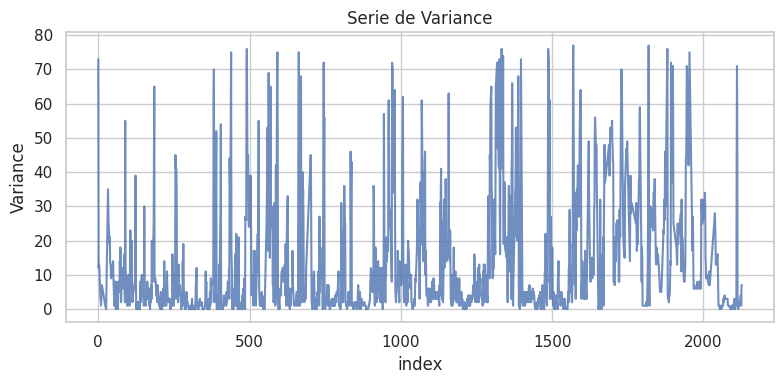

In [34]:
# Filtrar solo las variables continuas para el gráfico de líneas
plot_lineplots(data_clean[variables_continuas].reset_index(), time_col='index', show=True)

#### Densidad

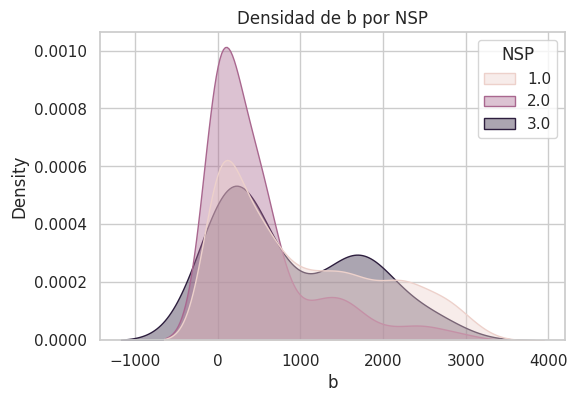

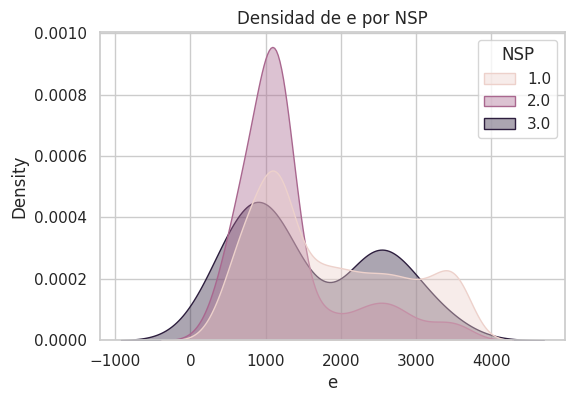

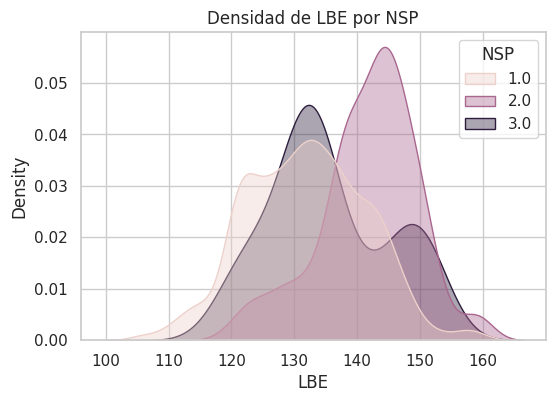

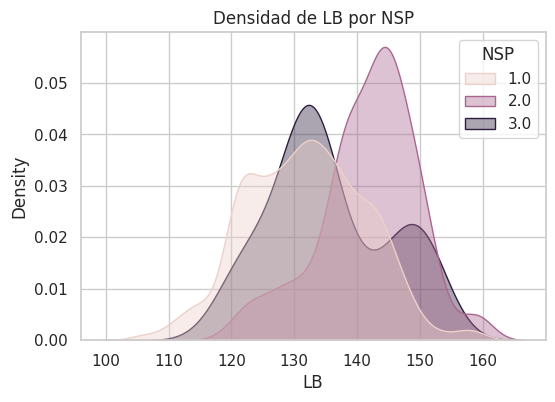

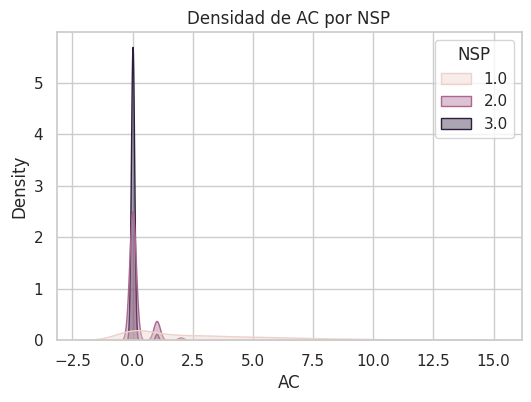

...

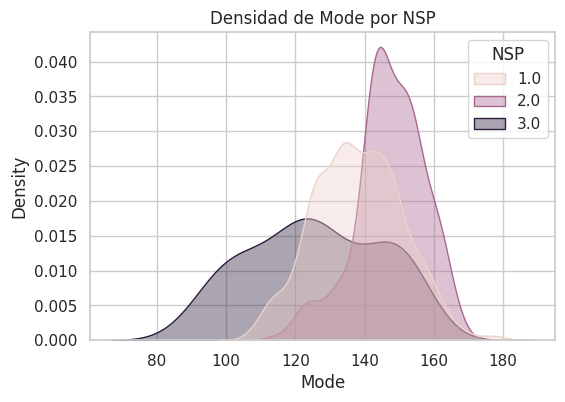

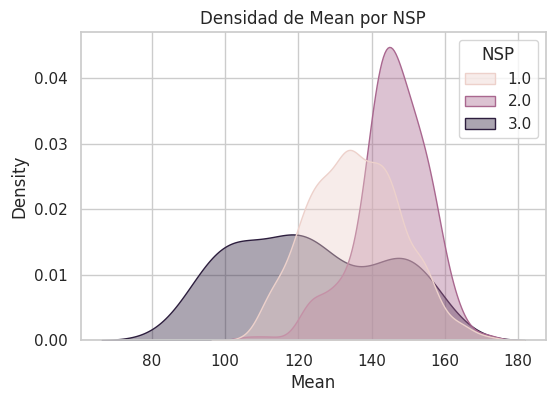

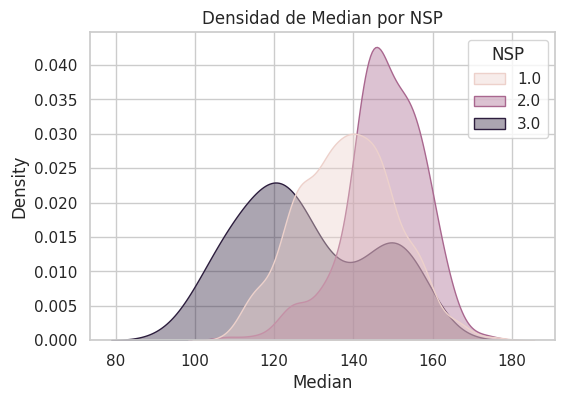

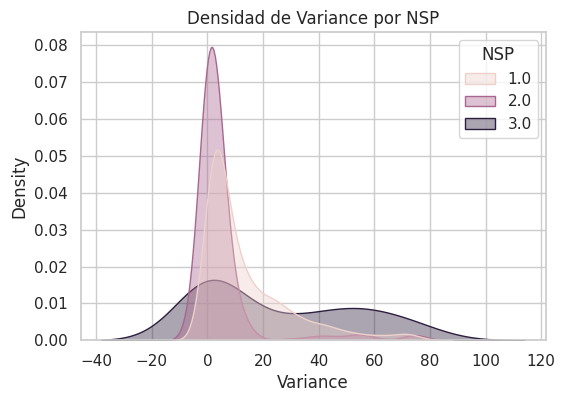

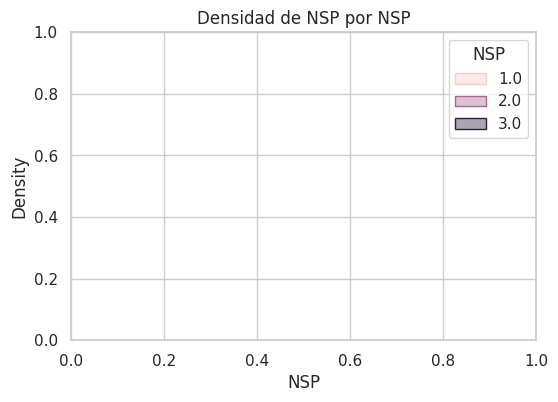

In [35]:
plot_density(data_clean[variables_continuas+['NSP']], target_col="NSP", show=True)

#### Dot plot

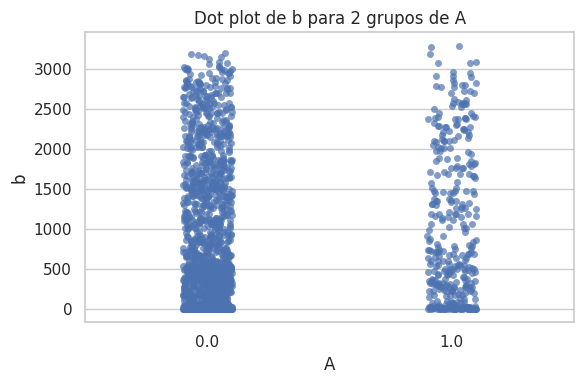

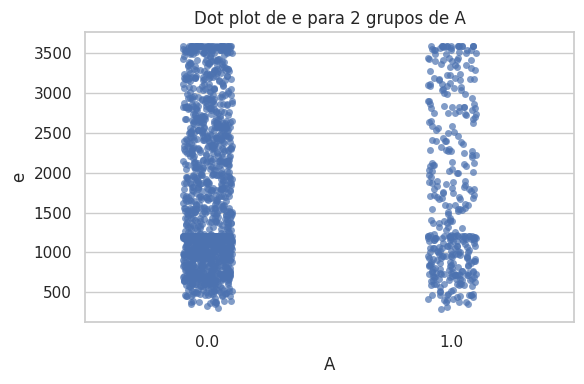

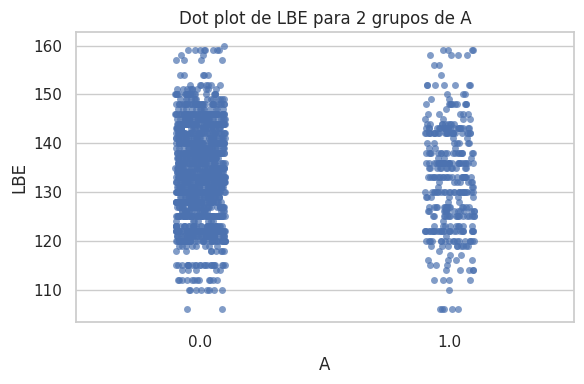

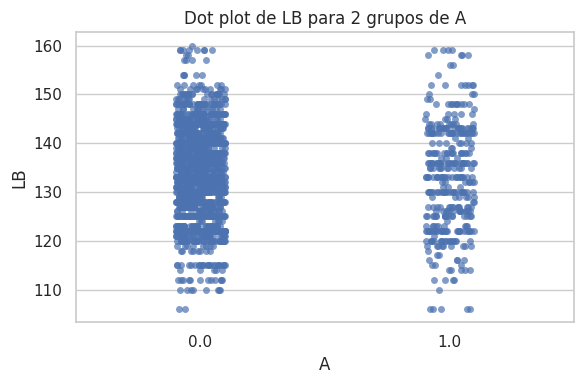

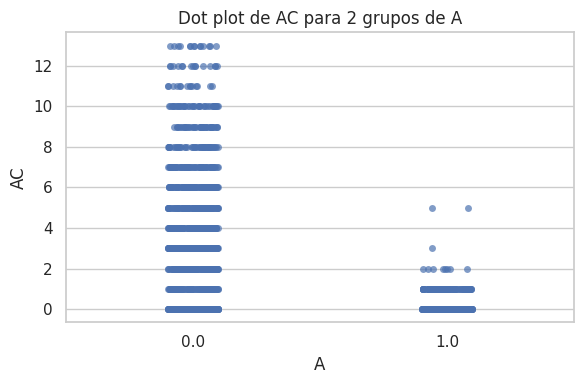

...

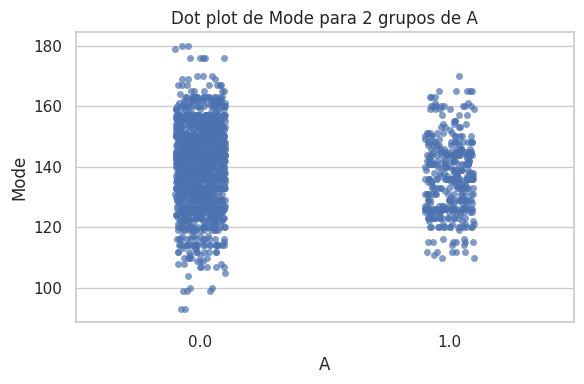

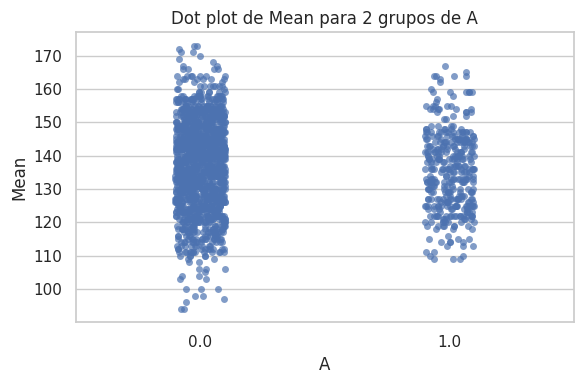

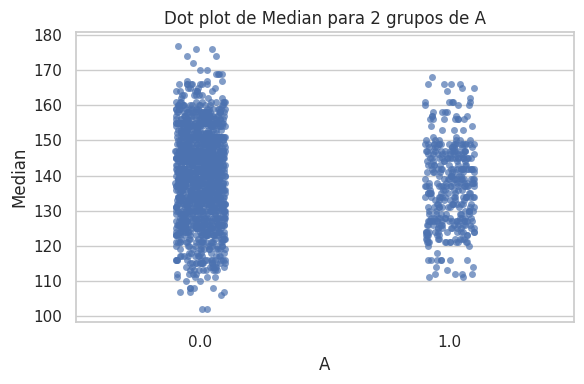

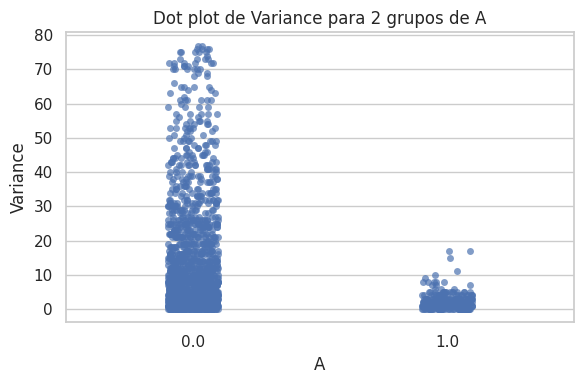

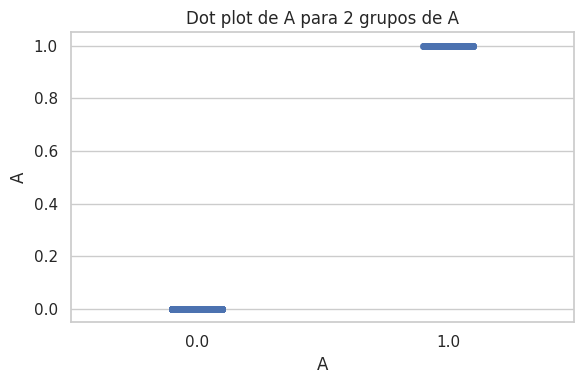

In [36]:
plot_dotplots(data_clean[variables_continuas + ['A']], target_col="A", show=True)

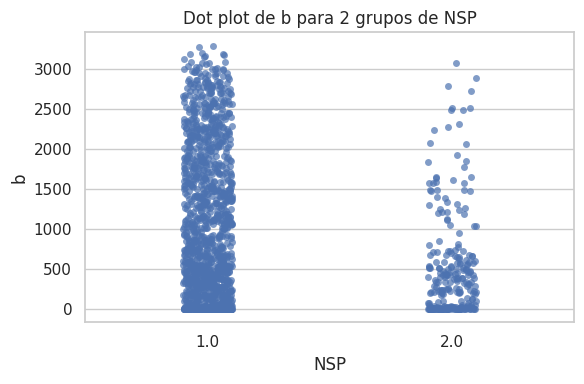

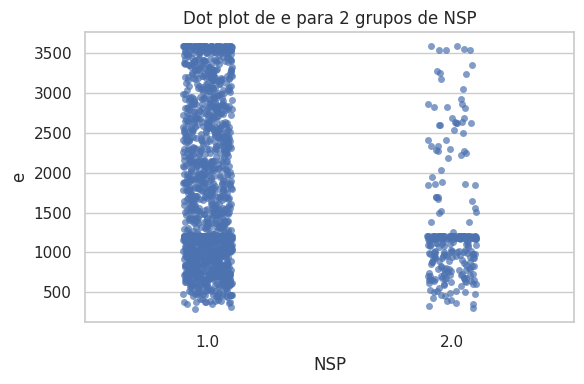

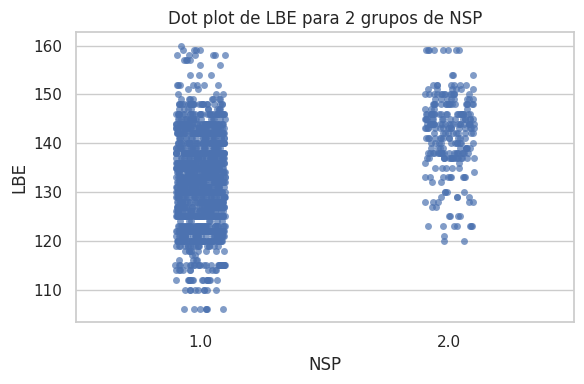

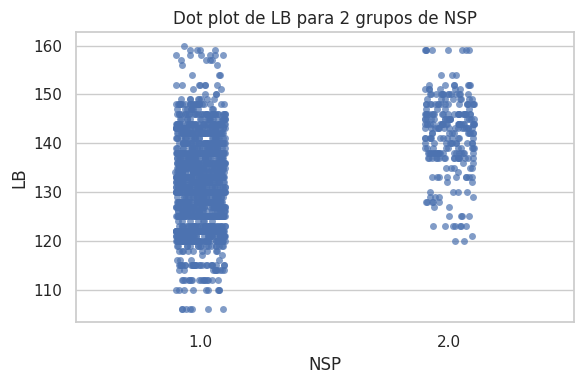

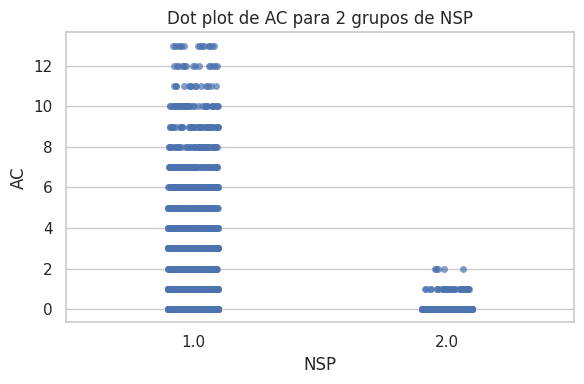

...

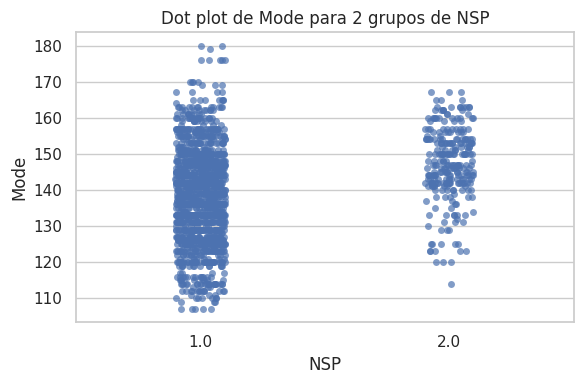

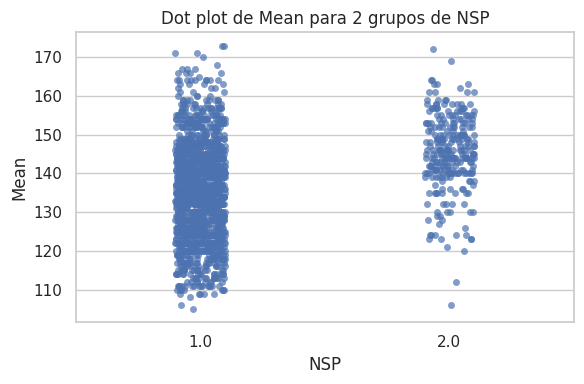

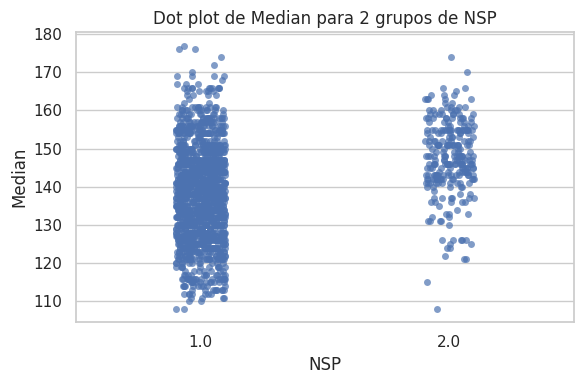

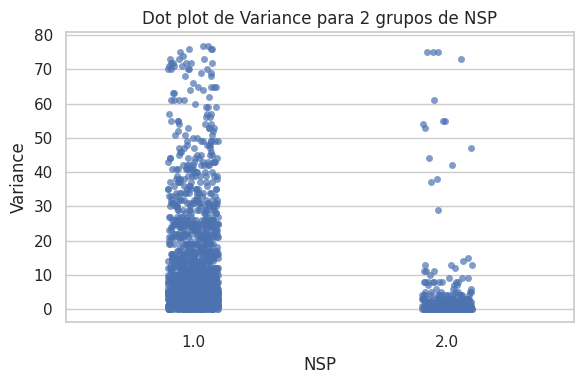

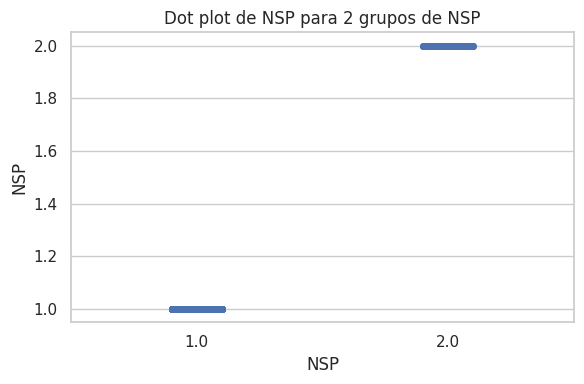

In [37]:
plot_dotplots(data_clean[variables_continuas + ['NSP']], target_col="NSP", show=True)

#### Violín + Swarmplot

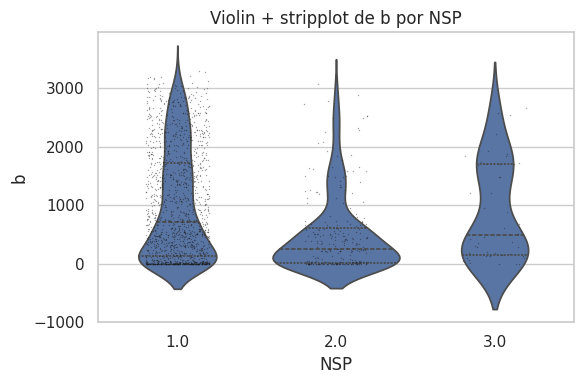

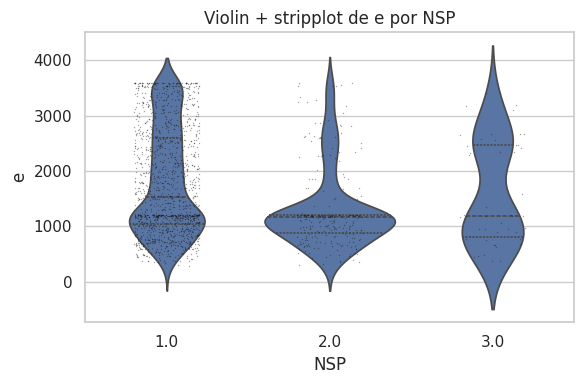

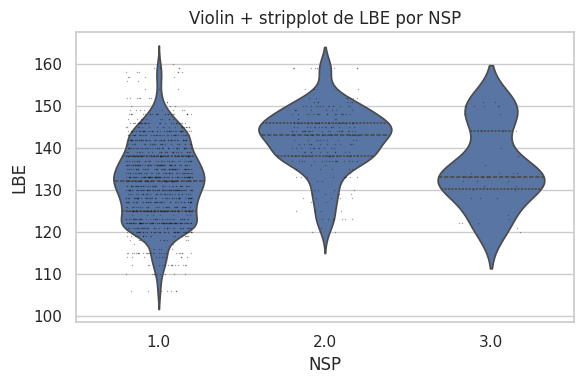

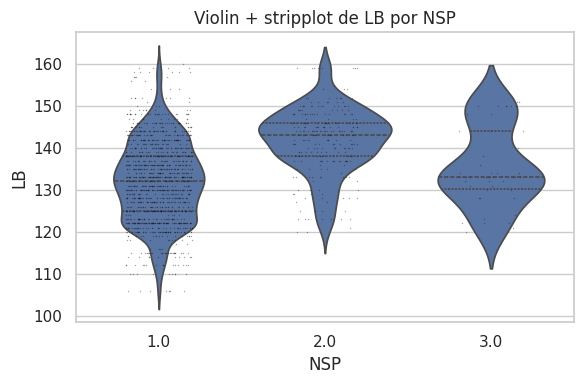

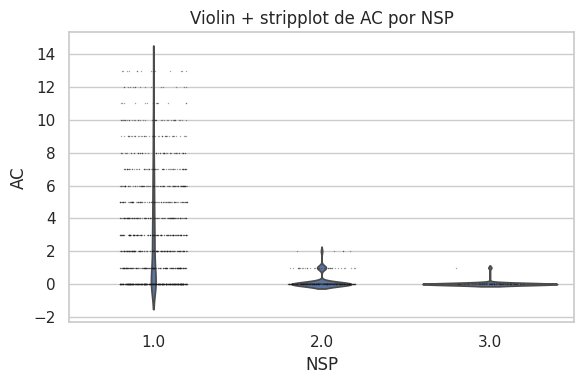

...

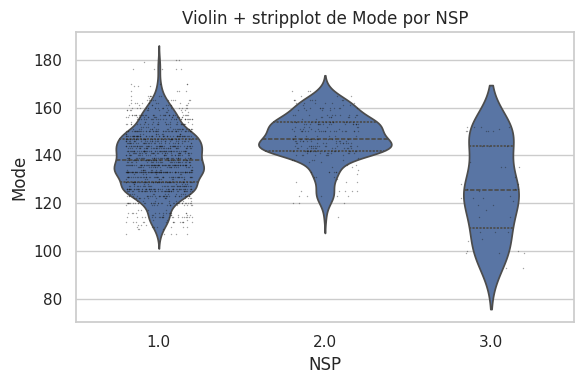

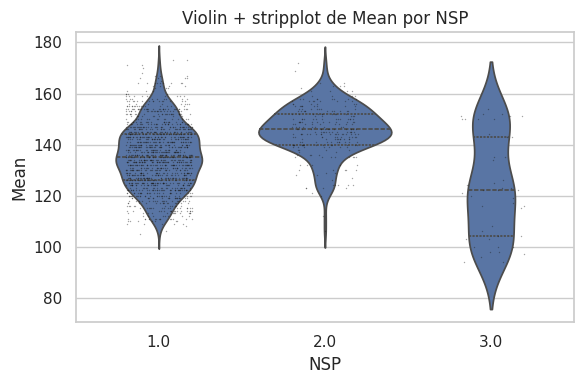

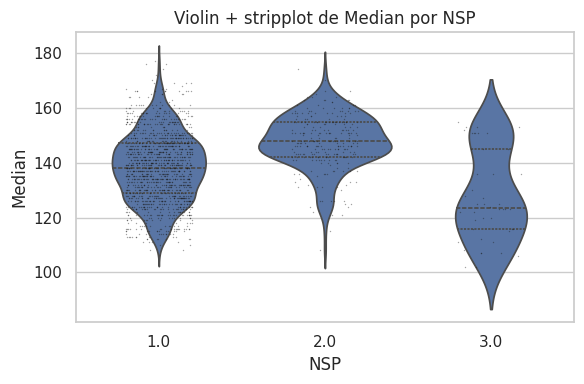

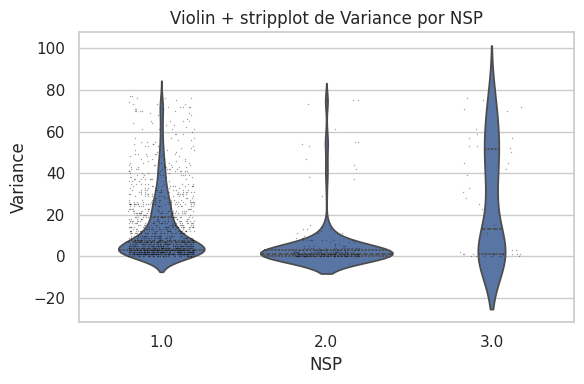

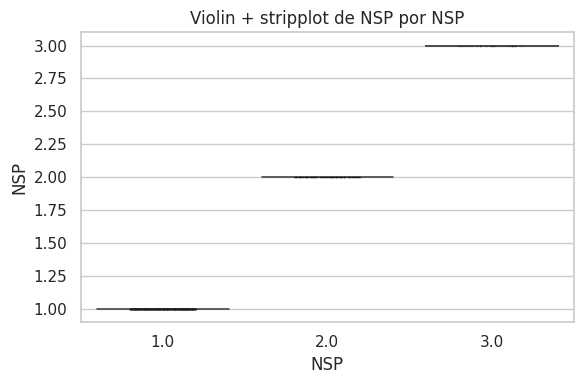

In [38]:
plot_violins(data_clean[variables_continuas+['NSP']], target_col="NSP", show=True)

#### Mapa de calor

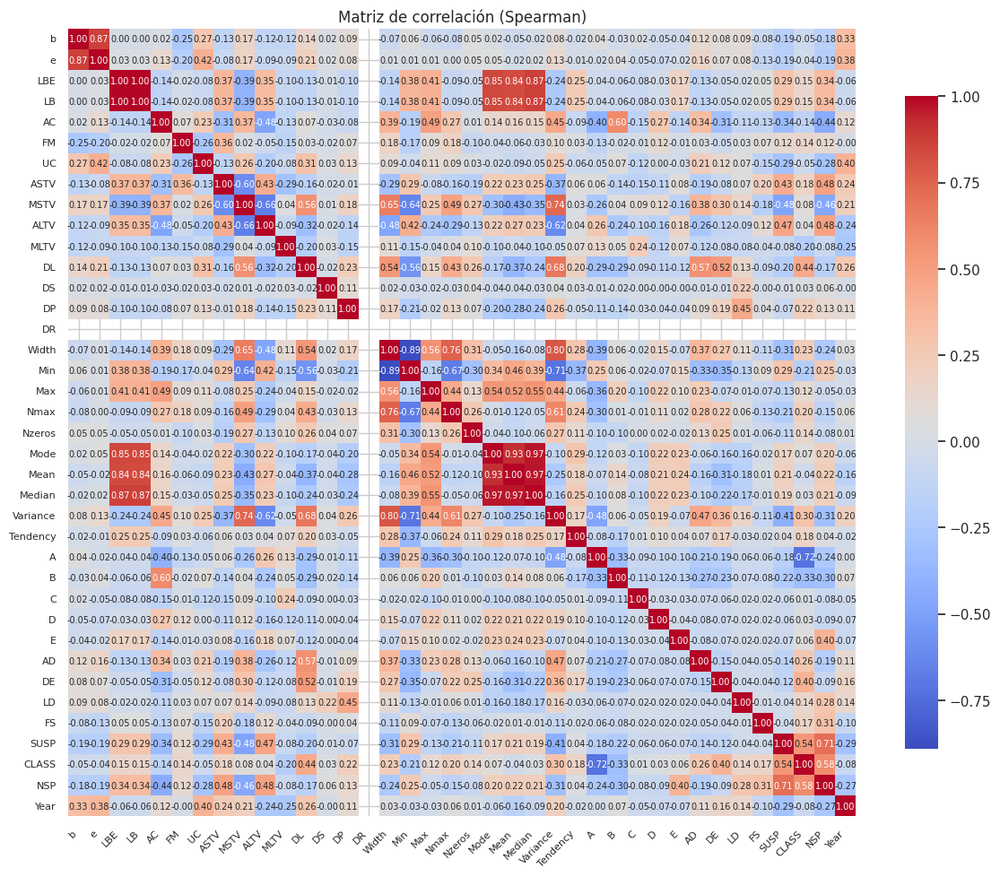

In [39]:
plot_heatmap(data_clean, show=True)